In [1]:
%matplotlib inline
import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = (10.0, 7.0)
from sklearn.model_selection import train_test_split
from sklearn import metrics

In [2]:
%matplotlib inline
import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = (10.0, 7.0)

import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from collections import defaultdict
from Bio import SeqIO
from nltk import bigrams
from nltk import trigrams

# import theano
# theano.config.device = 'gpu'
# theano.config.floatX = 'float32'
from keras.layers import Dropout
from keras.layers import Input, Dense, Lambda
from keras.models import Model
from keras import backend as K
from keras import objectives
from keras.datasets import mnist
from sklearn.preprocessing import normalize
from sklearn.utils import shuffle
from keras import regularizers

from keras.models import Sequential
from keras.layers import Dense
from keras.wrappers.scikit_learn import KerasClassifier
from keras.utils import np_utils
from sklearn.model_selection import cross_val_score
#from sklearn. model_selection import cross_val_score
from sklearn.model_selection import KFold
from sklearn.preprocessing import LabelEncoder
from sklearn.pipeline import Pipeline
from sklearn.cross_validation import StratifiedKFold
from sklearn.cross_validation import KFold
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score

Using Theano backend.
Using gpu device 0: Quadro K620 (CNMeM is enabled with initial size: 70.0% of memory, cuDNN 5105)
/home/nafizh/anaconda/lib/python2.7/site-packages/sklearn/cross_validation.py:44: DeprecationWarning: This module was deprecated in version 0.18 in favor of the model_selection module into which all the refactored classes and functions are moved. Also note that the interface of the new CV iterators are different from that of this module. This module will be removed in 0.20.
  "This module will be removed in 0.20.", DeprecationWarning)


Lets prepare our toxin and curated context gene dataset for training

In [65]:
# # Creating a list of all possible bi-grams from protein alphabet

# from itertools import permutations
# protein_alphabet = "ARNDCEQGHILKMFPSTWYV"
# extra_tri_grams = ['AAA', 'RRR', 'NNN', 'DDD', 'CCC', 'EEE', 'QQQ','GGG', 'HHH', 'III', 'LLL', 'KKK', 'MMM', 'FFF',
#                  'PPP', 'SSS', 'TTT', 'WWW', 'YYY', 'VVV']
# #print permutations(protein_alphabet)
# all_tri_grams = [item[0]+item[1]+item[2] for item in permutations(protein_alphabet, 3)] + extra_tri_grams
# #print sorted(all_tri_grams)
# print len(all_tri_grams)
# print len(protein_alphabet)

6860
20


In [3]:
import itertools
all_tri_grams = []
for p in itertools.product("ARNDCEQGHILKMFPSTWYV", repeat=3):
    tok = p[0] + p[1] + p[2]
    all_tri_grams.append(tok)
    
print len(all_tri_grams)

8000


In [69]:
print 'RRT' in all_tri_grams

True


In [4]:
"""
Writing a method to build tri-grams, as it is being frequently needed
input: fasta_file
output: a csv type file of tri-gram values
"""


def build_tri_grams(input_file, output_file):
    tri_dic = defaultdict(int)

    out_handle = open(output_file, "w")
    for rec in SeqIO.parse(input_file, "fasta"):
        tok = rec.description.split("|")[-1]
        #print tok
        #print tok[0], tok[-1]
        #if tok == 'toxin':
        tri_tokens = trigrams(rec.seq)

        # tri_tokens is a generator - you can only go through it once
        for item in ((tri_tokens)):
            if '-' in item:
                continue
            tri_str = item[0] + item[1] + item[2]
            #print bi_str
            tri_dic[tri_str] += 1

        for index, item in enumerate(sorted(all_tri_grams)):
            if index > 0:
                out_handle.write(',')
            out_handle.write("%s" % tri_dic[item])
        out_handle.write("\n")
        tri_dic.update({}.fromkeys(tri_dic, 0)) # setting all key values to be zero again


    out_handle.close()

In [92]:
build_tri_grams('all_curated_context_genes.fa', 'all_curated_context_genes_trigrams')
build_tri_grams('class_1_protein.fa', 'class_1_tri_grams')
build_tri_grams('class_2_protein.fa', 'class_2_tri_grams')
build_tri_grams('seqs_for_testing_without_toxin.fa', 'seqs_for_testing_without_toxins_tri_grams')

In [4]:
# Getting curated context genes
# Loading the data into pandas dataframe
curated_context_data = pd.read_csv("all_curated_context_genes_trigrams", names=sorted(all_tri_grams))

# taking the values from panda into numpy array
cur_context_array = curated_context_data.values
print cur_context_array.shape
#print lacarray

cur_context_norm = normalize(cur_context_array.astype(float), norm = 'l1', axis = 1)
print np.sum(cur_context_norm, axis = 1)

(1240, 8000)
[ 1.  1.  1. ...,  1.  1.  1.]


In [5]:
# Getting curated context genes
# Loading the data into pandas dataframe
insig_context_data = pd.read_csv("all_insignificant_genes_cut_by_length_tri_grams", names=sorted(all_tri_grams))

# taking the values from panda into numpy array
insig_context_array = insig_context_data.values
print insig_context_array.shape
#print lacarray

insig_context_norm = normalize(insig_context_array.astype(float), norm = 'l1', axis = 1)
print np.sum(insig_context_norm, axis = 1)

(473, 8000)


ValueError: Input contains NaN, infinity or a value too large for dtype('float64').

In [5]:
# Getting the toxin genes from bagel
# Loading the data into pandas dataframe
import pandas as pd
class_1_data = pd.read_csv("class_1_tri_grams", names=sorted(all_tri_grams))
print class_1_data.shape
class_2_data = pd.read_csv("class_2_tri_grams", names=sorted(all_tri_grams))
print class_2_data.shape

array1 = class_1_data.values
#print array
array2 = class_2_data.values
total_array = np.vstack((array1, array2))
#print total_array

norm1 = normalize(total_array.astype(float), norm = 'l1', axis = 1)
#print np.sum(norm1, axis = 1)

(160, 8000)
(229, 8000)


In [6]:
# Getting experimentally verified context genes
seqs_for_testing_data = pd.read_csv("seqs_for_testing_without_toxins_tri_grams", names=sorted(all_tri_grams))

# taking the values from panda into numpy array
seqarray = seqs_for_testing_data.values
print seqarray.shape
#print seqarray

seqnewnorm = normalize(seqarray.astype(float), norm = 'l1', axis = 1)
print np.sum(seqnewnorm, axis = 1)

(54, 8000)
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.]


In [70]:
x_true_test_compressed = encoder.predict(x_test, batch_size = 100)
print x_true_test_compressed.shape
x_train_whole_compressed = encoder.predict(x_train, batch_size = 100)
print x_train_whole_compressed.shape

(505, 256)
(1178, 256)


In [6]:
# tinkering
X = np.array([[1., 0.], [2., 1.], [0., 0.]])
y = np.array([0, 1, 2])
from sklearn.utils import shuffle
X, y = shuffle(X, y, random_state=0)
print X
print y

[[ 0.  0.]
 [ 2.  1.]
 [ 1.  0.]]
[2 1 0]


In [7]:
"""
Bunching together toxins and context genes
"""
# Not normalized
bagel_experi_context = np.vstack((total_array.astype(float), seqarray.astype(float), cur_context_array.astype(float)))

# Normalized
#bagel_experi_context = np.vstack((norm1.astype(float), seqnewnorm.astype(float), cur_context_norm.astype(float)))
print bagel_experi_context.shape
print bagel_experi_context[0, :]

(1683, 8000)
[ 0.  0.  0. ...,  0.  0.  0.]


In [8]:
# Splitting data into training and test set 
#np.random.shuffle(bagel_experi_context)

y = np.vstack((np.zeros((norm1.shape[0], 1)), np.ones((seqnewnorm.shape[0] + cur_context_norm.shape[0],1))))

# Shuffle in unision
bagel_experi_context, y = shuffle(bagel_experi_context, y, random_state = 0)

#x_train, x_test = bagel_experi_context[:1040,:], bagel_experi_context[1040:1680 ,:]
#StratifiedKFold(np.reshape(y_train, (1040, )), n_folds=10, shuffle=True, random_state=0)

x_train, x_test, y_train, y_test = train_test_split(bagel_experi_context, y, test_size=0.3, random_state=42, 
                                                   stratify = y)
#y_train,  y_test = y[:1040, :], y[1040:1680 , :]
#y_train, y_val, y_test = y[:800, :], y[800:1040, ], y[1040:1680 , :]

# we are not using y_val for autoencoders - lets check if it improves accuracy
#x_train, x_val, x_test = bagel_experi_context[:800,:], bagel_experi_context[800:1040,:], bagel_experi_context[1040:1680 ,:]

# for the Vanilla classifier only
# X_main = bagel_experi_context[:1680, :]
# y_main = y[:1680, :]

print y_train.shape
print y_test.shape
#print y

(1178, 1)
(505, 1)


In [253]:
"""
Training and Test data with insignificant genes
"""

# Not normalized
all_with_insig_context = np.vstack((norm1.astype(float), seqnewnorm.astype(float), cur_context_norm.astype(float), 
                                   insig_context_norm.astype(float)))

# Normalized
#bagel_experi_context = np.vstack((norm1.astype(float), seqnewnorm.astype(float), cur_context_norm.astype(float)))
print all_with_insig_context.shape
print all_with_insig_context[0, :]

# Splitting data into training and test set 
#np.random.shuffle(bagel_experi_context)

y = np.vstack((np.zeros((norm1.shape[0], 1)), np.ones((seqnewnorm.shape[0] + cur_context_norm.shape[0],1)),
               np.full((473, 1), 2)))

# Shuffle in unision
all_with_insig_context, y = shuffle(all_with_insig_context, y, random_state = 0)

x_train, x_test = all_with_insig_context[:1720,:], all_with_insig_context[1720:2120 ,:]
y_train, y_test = y[:1720, :], y[1720:2120 , :]

# for the Vanilla classifier only
# X_main = bagel_experi_context[:1680, :]
# y_main = y[:1680, :]

print y_train.shape
print y_test.shape
#print y

(2156, 6860)
[ 0.  0.  0. ...,  0.  0.  0.]
(1720, 1)
(400, 1)


In [9]:
print x_train.shape
print x_test.shape
print y_train.shape
print y_test[y_test == 0].shape
print y_test.shape
#print x_train[0, :][0:500]

(1178, 8000)
(505, 8000)
(1178, 1)
(117,)
(505, 1)


## Variational Autoencoder
Now, lets try building a Keras variational autoencoder and trying out things

In [10]:
batch_size = 80
original_dim = 6860
latent_dim = 2
intermediate_dim = 256
nb_epoch = 400
epsilon_std = 0.01

x = Input(batch_shape=(batch_size, original_dim))
x = Dropout(0.8)(x)
h = Dense(intermediate_dim, activation='relu')(x)
#h.add(Dropout(0.5))
h = Dropout(0.8)(h)
z_mean = Dense(latent_dim)(h)
z_log_var = Dense(latent_dim)(h)


def sampling(args):
    z_mean, z_log_var = args
    epsilon = K.random_normal(shape=(batch_size, latent_dim), mean=0.,
                              std=epsilon_std)
    return z_mean + K.exp(z_log_var / 2) * epsilon

# note that "output_shape" isn't necessary with the TensorFlow backend
z = Lambda(sampling, output_shape=(latent_dim,))([z_mean, z_log_var])


In [12]:
# we instantiate these layers separately so as to reuse them later
decoder_h = Dense(intermediate_dim, activation='relu')
decoder_mean = Dense(original_dim, activation='sigmoid')
h_decoded = decoder_h(z)
x_decoded_mean = decoder_mean(h_decoded)


def vae_loss(x, x_decoded_mean):
    xent_loss = original_dim * objectives.binary_crossentropy(x, x_decoded_mean)
    kl_loss = - 0.5 * K.sum(1 + z_log_var - K.square(z_mean) - K.exp(z_log_var), axis=-1)
    return xent_loss + kl_loss

vae = Model(x, x_decoded_mean)
vae.compile(optimizer='adam', loss=vae_loss)

/home/nafizh/anaconda/lib/python2.7/site-packages/keras/engine/topology.py:1656: UserWarning: Model inputs must come from a Keras Input layer, they cannot be the output of a previous non-Input layer. Here, a tensor specified as input to "model_1" was not an Input tensor, it was generated by layer dropout_2.
Note that input tensors are instantiated via `tensor = Input(shape)`.
The tensor that caused the issue was: None
  str(x.name))


Exception: Graph disconnected: cannot obtain value for tensor input_2 at layer "input_2". The following previous layers were accessed without issue: []

In [ ]:
# train the VAE on MNIST digits
# (x_train, y_train), (x_test, y_test) = mnist.load_data()

# x_train = x_train.astype('float32') / 255.
# x_test = x_test.astype('float32') / 255.
# x_train = x_train.reshape((len(x_train), np.prod(x_train.shape[1:])))
# x_test = x_test.reshape((len(x_test), np.prod(x_test.shape[1:])))


vae.fit(x_train, x_train,
        shuffle=True,
        nb_epoch= 2000,
        batch_size=batch_size,
        validation_data=(x_test, x_test))

Train on 1040 samples, validate on 640 samples
Epoch 1/2000
1040/1040 [==============================] - 0s - loss: 754.7006 - val_loss: 810.2761
Epoch 2/2000
1040/1040 [==============================] - 0s - loss: 756.1719 - val_loss: 810.2851
Epoch 3/2000
1040/1040 [==============================] - 0s - loss: 758.3395 - val_loss: 811.1918
Epoch 4/2000
1040/1040 [==============================] - 0s - loss: 756.0906 - val_loss: 809.5492
Epoch 5/2000
1040/1040 [==============================] - 0s - loss: 755.6564 - val_loss: 809.1777
Epoch 6/2000
1040/1040 [==============================] - 0s - loss: 754.9336 - val_loss: 810.8855
Epoch 7/2000
1040/1040 [==============================] - 0s - loss: 756.5945 - val_loss: 811.0865
Epoch 8/2000
1040/1040 [==============================] - 0s - loss: 754.7138 - val_loss: 808.6966
Epoch 9/2000
1040/1040 [==============================] - 0s - loss: 754.0607 - val_loss: 807.4847
Epoch 10/2000
1040/1040 [==============================] - 0s 

In [12]:
print z_mean.shape
print len(vae.layers)
my_layer = vae.layers[0]
end_layer = vae.layers[6]
print my_layer.get_config()
#print end_layer.get_config()
print vae.layers[1].get_config()
print vae.layers[2].get_config()
print vae.layers[3].get_config()
print vae.layers[4].get_config()
print vae.layers[5].get_config()
print vae.layers[6].get_config()

Shape.0
7
{'batch_input_shape': (80, 6860), 'sparse': False, 'input_dtype': 'float32', 'name': 'input_2'}
{'W_constraint': None, 'b_constraint': None, 'name': 'dense_4', 'activity_regularizer': None, 'trainable': True, 'init': 'glorot_uniform', 'bias': True, 'activation': 'relu', 'input_dim': None, 'b_regularizer': None, 'W_regularizer': None, 'output_dim': 256}
{'W_constraint': None, 'b_constraint': None, 'name': 'dense_5', 'activity_regularizer': None, 'trainable': True, 'init': 'glorot_uniform', 'bias': True, 'activation': 'linear', 'input_dim': None, 'b_regularizer': None, 'W_regularizer': None, 'output_dim': 2}
{'W_constraint': None, 'b_constraint': None, 'name': 'dense_6', 'activity_regularizer': None, 'trainable': True, 'init': 'glorot_uniform', 'bias': True, 'activation': 'linear', 'input_dim': None, 'b_regularizer': None, 'W_regularizer': None, 'output_dim': 2}
{'function': (u'c\x01\x00\x00\x00\x04\x00\x00\x00\x07\x00\x00\x00C\x00\x00\x00sI\x00\x00\x00|\x00\x00\\\x02\x00}\x01\

(640, 2)


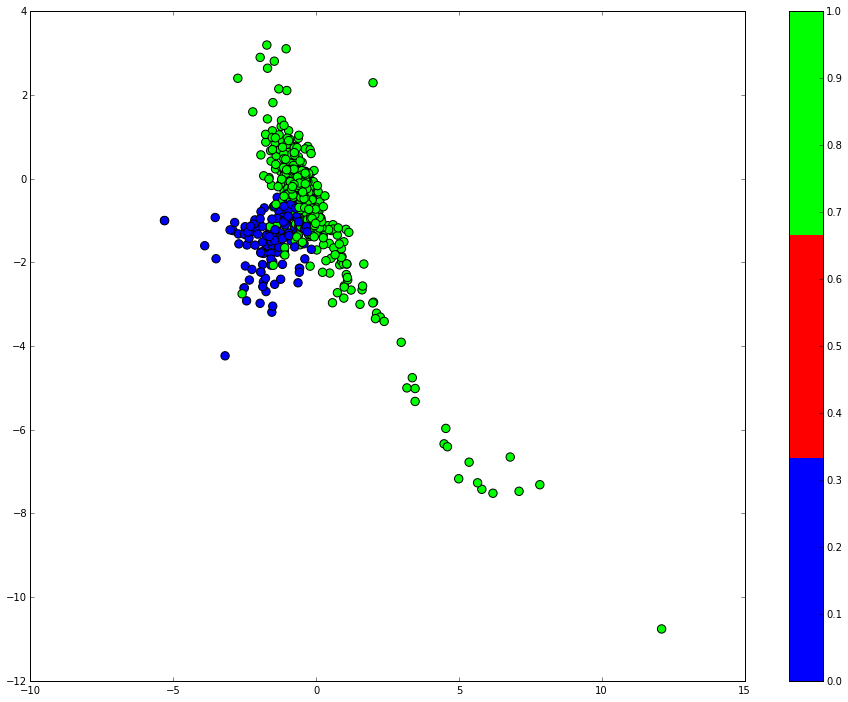

In [161]:
# build a model to project inputs on the latent space
encoder = Model(x, z_mean)

# display a 2D plot of the digit classes in the latent space
x_test_encoded = encoder.predict(x_test, batch_size=batch_size)
print x_test_encoded.shape
plt.scatter(x_test_encoded[:, 0], x_test_encoded[:, 1], c=y_test, cmap = plt.cm.get_cmap("brg", 3), s = 70)
plt.colorbar()
plt.show()

In [95]:
# build a digit generator that can sample from the learned distribution
decoder_input = Input(shape=(latent_dim,))
_h_decoded = decoder_h(decoder_input)
_x_decoded_mean = decoder_mean(_h_decoded)
generator = Model(decoder_input, _x_decoded_mean)

# display a 2D manifold of the digits
n = 15  # figure with 15x15 digits
digit_size = 28
#figure = np.zeros((digit_size * n, digit_size * n))
# we will sample n points within [-15, 15] standard deviations
grid_x = np.linspace(-15, 15, n)
grid_y = np.linspace(-15, 15, n)
print grid_x.shape
print grid_y.shape

for i, yi in enumerate(grid_x):
    for j, xi in enumerate(grid_y):
        z_sample = np.array([[xi, yi]])
        x_decoded = generator.predict(z_sample)
        #print x_decoded
        
        
# plt.scatter(x_decoded[:, 0], x_decoded[:, 1], cmap = plt.cm.get_cmap("brg", 3), s = 70)
# plt.colorbar()
# plt.show()

# plt.figure(figsize=(10, 10))
# plt.imshow(figure)
# plt.show()

(15,)
(15,)


## Random Forest Classifier - input compressed

In [423]:
"""
Grid Search for parameters
"""
from sklearn.grid_search import GridSearchCV
from sklearn.ensemble import RandomForestClassifier

pipe_randf = Pipeline([('randf', RandomForestClassifier(random_state=1))])
#param_range = [0.0001, 0.001, 0.01, 0.1, 1.0, 10.0, 100.0, 1000.0]
param_grid = [{'randf__n_estimators': [10, 13, 15, 17, 20], 'randf__criterion': ['gini', 'entropy'], 'randf__max_depth': [3,4,5,6,7,8,9,10,None]},
             {'randf__n_estimators': [10, 13, 15, 17, 20], 'randf__criterion': ['gini', 'entropy'], 'randf__max_depth': [3,4,5,6,7,8,9,10,None],
             'randf__class_weight': ['balanced']}]

cv = StratifiedKFold(np.reshape(y_train, (y_train.shape[0], )), n_folds= 5, shuffle=True, random_state=42)
gs = GridSearchCV(estimator=pipe_randf, param_grid=param_grid, scoring='f1', cv= cv)
gs = gs.fit(x_train_whole_compressed, y_train)

print(gs.best_score_)
print(gs.best_params_)

0.970608723007
{'randf__n_estimators': 17, 'randf__criterion': 'entropy', 'randf__max_depth': None, 'randf__class_weight': 'balanced'}


In [424]:
"""
Doing cross validation and checking precision, recall, F1 score
"""
from sklearn.model_selection import cross_val_score
randf_cl = RandomForestClassifier(n_estimators = 17, criterion = 'entropy', max_depth = None, class_weight = 'balanced', 
                                 random_state = 1)
cv = StratifiedKFold(np.reshape(y_train, (y_train.shape[0], )), n_folds= 5, shuffle=True, random_state=42)
f1_scores = cross_val_score(randf_cl, x_train_whole_compressed, y_train, cv=cv, scoring = 'f1')
recall_scores = cross_val_score(randf_cl, x_train_whole_compressed, y_train, cv=cv, scoring = 'recall')
precision_scores = cross_val_score(randf_cl, x_train_whole_compressed, y_train, cv=cv, scoring = 'precision')

print 'F1:', f1_scores
print 'Recall:', recall_scores
print 'Precision:', precision_scores

F1: [ 0.97237569  0.97777778  0.96969697  0.96935933  0.9637883 ]
Recall: [ 0.96703297  0.97237569  0.97237569  0.96132597  0.9558011 ]
Precision: [ 0.97777778  0.98324022  0.96703297  0.97752809  0.97191011]


In [425]:
"""
This manual cross validation is done to check on performance for individual classes
(check for 0.0s in toxin prediction)
"""

#results = cross_val_score(classifier_1, x_train, y_train, cv = kfold)
from sklearn import metrics
from sklearn.ensemble import RandomForestClassifier

def create_model():
    # create your model using this function
    classifier = RandomForestClassifier(n_estimators = 17, criterion = 'entropy', max_depth = None, 
                                        class_weight = 'balanced', random_state = 1)
    return classifier 

models_logis_c = []
def train_and_evaluate_model(model, tr, tr_l, tr_te, tr_te_l):
#     print "tr", tr.shape
#     print "tr_l", tr_l.shape
#     print "tr_te", tr_te.shape
#     print "tr_te_l", tr_te_l.shape
    model.fit(tr, tr_l)
    #tr_te = np.ravel(tr_te)
    scores = model.predict(tr_te)
    print(metrics.classification_report(tr_te_l, scores))
    #print("%s: %.2f%%" % (model.metrics_names[1], scores[1]*100))
    print 
    models_logis_c.append(model)
    # fit and evaluate here.


    
#skf = KFold(1040, n_folds=10, shuffle=True)
skf = StratifiedKFold(np.reshape(y_train, (y_train.shape[0], )), n_folds=5, shuffle=True, random_state=42)
#print skf

for i, (train, test) in enumerate(skf):
    print "Running Fold", i+1, "/", 5
    model = None # Clearing the NN.
    model = create_model()
    print train.shape, test.shape
    train_and_evaluate_model(model, x_train_whole_compressed[train], y_train[train], x_train_whole_compressed[test], 
                             y_train[test])

Running Fold 1 / 5
(941,) (237,)
             precision    recall  f1-score   support

        0.0       0.89      0.93      0.91        55
        1.0       0.98      0.97      0.97       182

avg / total       0.96      0.96      0.96       237


Running Fold 2 / 5
(942,) (236,)


/home/nafizh/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:22: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().


             precision    recall  f1-score   support

        0.0       0.91      0.95      0.93        55
        1.0       0.98      0.97      0.98       181

avg / total       0.97      0.97      0.97       236


Running Fold 3 / 5
(943,) (235,)
             precision    recall  f1-score   support

        0.0       0.91      0.89      0.90        54
        1.0       0.97      0.97      0.97       181

avg / total       0.95      0.95      0.95       235


Running Fold 4 / 5
(943,) (235,)
             precision    recall  f1-score   support

        0.0       0.88      0.93      0.90        54
        1.0       0.98      0.96      0.97       181

avg / total       0.95      0.95      0.95       235


Running Fold 5 / 5
(943,) (235,)
             precision    recall  f1-score   support

        0.0       0.86      0.91      0.88        54
        1.0       0.97      0.96      0.96       181

avg / total       0.95      0.94      0.95       235




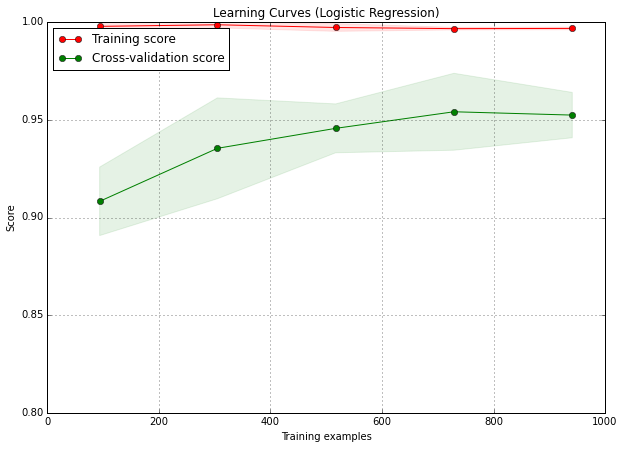

In [426]:
from sklearn.model_selection import learning_curve

def plot_learning_curve(estimator, title, X, y, ylim=None, cv=None,
                        n_jobs=1, train_sizes=np.linspace(.1, 1.0, 5)):
    plt.figure()
    plt.title(title)
    if ylim is not None:
        plt.ylim(*ylim)
    plt.xlabel("Training examples")
    plt.ylabel("Score")
    train_sizes, train_scores, test_scores = learning_curve(
        estimator, X, y, cv=cv, n_jobs=n_jobs, train_sizes=train_sizes, scoring = 'accuracy')
    train_scores_mean = np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    test_scores_mean = np.mean(test_scores, axis=1)
    test_scores_std = np.std(test_scores, axis=1)
    plt.grid()

    plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
                     train_scores_mean + train_scores_std, alpha=0.1,
                     color="r")
    plt.fill_between(train_sizes, test_scores_mean - test_scores_std,
                     test_scores_mean + test_scores_std, alpha=0.1, color="g")
    plt.plot(train_sizes, train_scores_mean, 'o-', color="r",
             label="Training score")
    plt.plot(train_sizes, test_scores_mean, 'o-', color="g",
             label="Cross-validation score")
    
    plt.ylim([0.8, 1.0])
    plt.legend(loc="best")
    return plt


title = "Learning Curves (Logistic Regression)"
# SVC is more expensive so we do a lower number of CV iterations:
cv = StratifiedKFold(np.reshape(y_train, (y_train.shape[0], )), n_folds= 5, shuffle=True, random_state=42)
estimator = RandomForestClassifier(n_estimators = 17, criterion = 'entropy', max_depth = None, class_weight = 'balanced', 
                                 random_state = 1)
plot_learning_curve(estimator, title, x_train_whole_compressed, y_train, cv=cv)

plt.show()

In [427]:
"""
Test set Evaluation
"""
from sklearn.ensemble import RandomForestClassifier
classifier = RandomForestClassifier(n_estimators = 17, criterion = 'entropy', max_depth = None, 
                                    class_weight = 'balanced', random_state = 1)
classifier.fit(x_train_whole_compressed, y_train)
scores = classifier.predict(x_true_test_compressed)
print(metrics.classification_report(y_test, scores))

/home/nafizh/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:7: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().


             precision    recall  f1-score   support

        0.0       0.91      0.96      0.93       117
        1.0       0.99      0.97      0.98       388

avg / total       0.97      0.97      0.97       505



## Decision Tree Classifier - input compressed

In [418]:
"""
Grid Search for parameters
"""
from sklearn.grid_search import GridSearchCV
from sklearn.tree import DecisionTreeClassifier

pipe_dect = Pipeline([('dect', DecisionTreeClassifier(random_state=1))])
#param_range = [0.0001, 0.001, 0.01, 0.1, 1.0, 10.0, 100.0, 1000.0]
param_grid = [{'dect__criterion': ['gini', 'entropy'], 'dect__max_depth': [3,4,5,6,7,8,9,10,None]},
             {'dect__criterion': ['gini', 'entropy'], 'dect__max_depth': [3,4,5,6,7,8,9,10,None],
             'dect__class_weight': ['balanced']}]

cv = StratifiedKFold(np.reshape(y_train, (y_train.shape[0], )), n_folds= 5, shuffle=True, random_state=42)
gs = GridSearchCV(estimator=pipe_dect, param_grid=param_grid, scoring='f1', cv= cv)
gs = gs.fit(x_train_whole_compressed, y_train)

print(gs.best_score_)
print(gs.best_params_)

0.950100410495
{'dect__criterion': 'gini', 'dect__max_depth': 9}


In [419]:
"""
Doing cross validation and checking precision, recall, F1 score
"""
from sklearn.model_selection import cross_val_score
dect_cl = DecisionTreeClassifier(criterion= 'gini', max_depth= 9, random_state = 1)
cv = StratifiedKFold(np.reshape(y_train, (y_train.shape[0], )), n_folds= 5, shuffle=True, random_state=42)
f1_scores = cross_val_score(dect_cl, x_train_whole_compressed, y_train, cv=cv, scoring = 'f1')
recall_scores = cross_val_score(dect_cl, x_train_whole_compressed, y_train, cv=cv, scoring = 'recall')
precision_scores = cross_val_score(dect_cl, x_train_whole_compressed, y_train, cv=cv, scoring = 'precision')

print 'F1:', f1_scores
print 'Recall:', recall_scores
print 'Precision:', precision_scores

F1: [ 0.95774648  0.9476584   0.95290859  0.94535519  0.94677871]
Recall: [ 0.93406593  0.95027624  0.95027624  0.9558011   0.93370166]
Precision: [ 0.98265896  0.94505495  0.95555556  0.93513514  0.96022727]


In [420]:
"""
This manual cross validation is done to check on performance for individual classes
(check for 0.0s in toxin prediction)
"""

#results = cross_val_score(classifier_1, x_train, y_train, cv = kfold)
from sklearn import metrics
from sklearn.tree import DecisionTreeClassifier

def create_model():
    # create your model using this function
    classifier = DecisionTreeClassifier(criterion= 'gini', max_depth= 9, random_state = 1)
    return classifier 

models_logis_c = []
def train_and_evaluate_model(model, tr, tr_l, tr_te, tr_te_l):
#     print "tr", tr.shape
#     print "tr_l", tr_l.shape
#     print "tr_te", tr_te.shape
#     print "tr_te_l", tr_te_l.shape
    model.fit(tr, tr_l)
    #tr_te = np.ravel(tr_te)
    scores = model.predict(tr_te)
    print(metrics.classification_report(tr_te_l, scores))
    #print("%s: %.2f%%" % (model.metrics_names[1], scores[1]*100))
    print 
    models_logis_c.append(model)
    # fit and evaluate here.


    
#skf = KFold(1040, n_folds=10, shuffle=True)
skf = StratifiedKFold(np.reshape(y_train, (y_train.shape[0], )), n_folds=5, shuffle=True, random_state=42)
#print skf

for i, (train, test) in enumerate(skf):
    print "Running Fold", i+1, "/", 5
    model = None # Clearing the NN.
    model = create_model()
    print train.shape, test.shape
    train_and_evaluate_model(model, x_train_whole_compressed[train], y_train[train], x_train_whole_compressed[test], 
                             y_train[test])

Running Fold 1 / 5
(941,) (237,)
             precision    recall  f1-score   support

        0.0       0.81      0.95      0.87        55
        1.0       0.98      0.93      0.96       182

avg / total       0.94      0.94      0.94       237


Running Fold 2 / 5
(942,) (236,)
             precision    recall  f1-score   support

        0.0       0.83      0.82      0.83        55
        1.0       0.95      0.95      0.95       181

avg / total       0.92      0.92      0.92       236


Running Fold 3 / 5
(943,) (235,)
             precision    recall  f1-score   support

        0.0       0.84      0.85      0.84        54
        1.0       0.96      0.95      0.95       181

avg / total       0.93      0.93      0.93       235


Running Fold 4 / 5
(943,) (235,)
             precision    recall  f1-score   support

        0.0       0.84      0.78      0.81        54
        1.0       0.94      0.96      0.95       181

avg / total       0.91      0.91      0.91       235


Runn

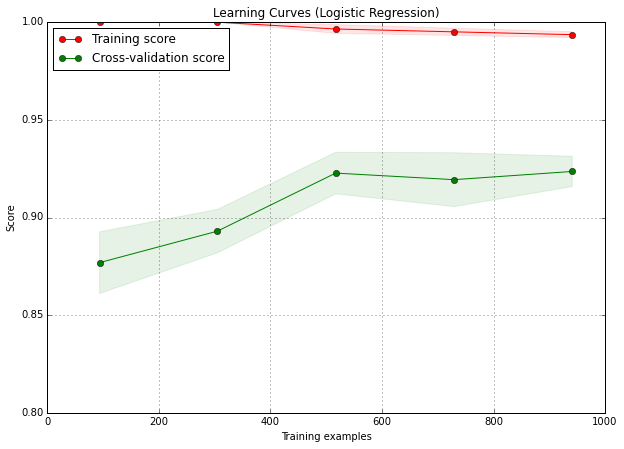

In [422]:
from sklearn.model_selection import learning_curve

def plot_learning_curve(estimator, title, X, y, ylim=None, cv=None,
                        n_jobs=1, train_sizes=np.linspace(.1, 1.0, 5)):
    plt.figure()
    plt.title(title)
    if ylim is not None:
        plt.ylim(*ylim)
    plt.xlabel("Training examples")
    plt.ylabel("Score")
    train_sizes, train_scores, test_scores = learning_curve(
        estimator, X, y, cv=cv, n_jobs=n_jobs, train_sizes=train_sizes, scoring = 'accuracy')
    train_scores_mean = np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    test_scores_mean = np.mean(test_scores, axis=1)
    test_scores_std = np.std(test_scores, axis=1)
    plt.grid()

    plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
                     train_scores_mean + train_scores_std, alpha=0.1,
                     color="r")
    plt.fill_between(train_sizes, test_scores_mean - test_scores_std,
                     test_scores_mean + test_scores_std, alpha=0.1, color="g")
    plt.plot(train_sizes, train_scores_mean, 'o-', color="r",
             label="Training score")
    plt.plot(train_sizes, test_scores_mean, 'o-', color="g",
             label="Cross-validation score")
    
    plt.ylim([0.8, 1.0])
    plt.legend(loc="best")
    return plt


title = "Learning Curves (Logistic Regression)"
# SVC is more expensive so we do a lower number of CV iterations:
cv = StratifiedKFold(np.reshape(y_train, (y_train.shape[0], )), n_folds= 5, shuffle=True, random_state=42)
estimator = DecisionTreeClassifier(criterion= 'gini', max_depth= 9, random_state = 1)
plot_learning_curve(estimator, title, x_train_whole_compressed, y_train, cv=cv)

plt.show()

In [421]:
"""
Test set Evaluation
"""
from sklearn.tree import DecisionTreeClassifier
classifier = DecisionTreeClassifier(criterion= 'gini', max_depth= 9, random_state = 1)
classifier.fit(x_train_whole_compressed, y_train)
scores = classifier.predict(x_true_test_compressed)
print(metrics.classification_report(y_test, scores))

             precision    recall  f1-score   support

        0.0       0.89      0.92      0.90       117
        1.0       0.98      0.96      0.97       388

avg / total       0.96      0.95      0.95       505



## K Nearest Neighbor Classifier - input compressed

In [413]:
"""
Grid Search for parameters
"""
from sklearn.grid_search import GridSearchCV
from sklearn.neighbors import KNeighborsClassifier

pipe_knn = Pipeline([('knn', KNeighborsClassifier())])
#param_range = [0.0001, 0.001, 0.01, 0.1, 1.0, 10.0, 100.0, 1000.0]
param_grid = [{'knn__n_neighbors': [2,3,4,5,6,7,8,9,10], 'knn__weights': ['uniform', 'distance'], 
              'knn__leaf_size': [20, 25, 30, 35, 40, 45, 50]}]

cv = StratifiedKFold(np.reshape(y_train, (y_train.shape[0], )), n_folds= 5, shuffle=True, random_state=42)
gs = GridSearchCV(estimator=pipe_knn, param_grid=param_grid, scoring='f1', cv= cv)
gs = gs.fit(x_train_whole_compressed, y_train)

print(gs.best_score_)
print(gs.best_params_)

0.959614504395
{'knn__leaf_size': 20, 'knn__weights': 'distance', 'knn__n_neighbors': 4}


In [414]:
"""
Doing cross validation and checking precision, recall, F1 score
"""
from sklearn.model_selection import cross_val_score

knn_cl = KNeighborsClassifier(weights = 'distance', n_neighbors = 4, leaf_size = 20)
cv = StratifiedKFold(np.reshape(y_train, (y_train.shape[0], )), n_folds= 5, shuffle=True, random_state=42)
f1_scores = cross_val_score(knn_cl, x_train_whole_compressed, y_train, cv=cv, scoring = 'f1')
recall_scores = cross_val_score(knn_cl, x_train_whole_compressed, y_train, cv=cv, scoring = 'recall')
precision_scores = cross_val_score(knn_cl, x_train_whole_compressed, y_train, cv=cv, scoring = 'precision')

print 'F1:', f1_scores
print 'Recall:', recall_scores
print 'Precision:', precision_scores

F1: [ 0.94857143  0.97191011  0.9512894   0.96296296  0.96338028]
Recall: [ 0.91208791  0.9558011   0.91712707  0.93370166  0.94475138]
Precision: [ 0.98809524  0.98857143  0.98809524  0.99411765  0.98275862]


In [417]:
"""
This manual cross validation is done to check on performance for individual classes
(check for 0.0s in toxin prediction)
"""

#results = cross_val_score(classifier_1, x_train, y_train, cv = kfold)
from sklearn import metrics
from sklearn.neighbors import KNeighborsClassifier

def create_model():
    # create your model using this function
    classifier = KNeighborsClassifier(weights = 'distance', n_neighbors = 4, leaf_size = 20)
    return classifier 

models_logis_c = []
def train_and_evaluate_model(model, tr, tr_l, tr_te, tr_te_l):
#     print "tr", tr.shape
#     print "tr_l", tr_l.shape
#     print "tr_te", tr_te.shape
#     print "tr_te_l", tr_te_l.shape
    model.fit(tr, tr_l)
    #tr_te = np.ravel(tr_te)
    scores = model.predict(tr_te)
    print(metrics.classification_report(tr_te_l, scores))
    #print("%s: %.2f%%" % (model.metrics_names[1], scores[1]*100))
    print 
    models_logis_c.append(model)
    # fit and evaluate here.


    
#skf = KFold(1040, n_folds=10, shuffle=True)
skf = StratifiedKFold(np.reshape(y_train, (y_train.shape[0], )), n_folds=5, shuffle=True, random_state=42)
#print skf

for i, (train, test) in enumerate(skf):
    print "Running Fold", i+1, "/", 5
    model = None # Clearing the NN.
    model = create_model()
    print train.shape, test.shape
    train_and_evaluate_model(model, x_train_whole_compressed[train], y_train[train], x_train_whole_compressed[test], 
                             y_train[test])

Running Fold 1 / 5
(941,) (237,)
             precision    recall  f1-score   support

        0.0       0.77      0.96      0.85        55
        1.0       0.99      0.91      0.95       182

avg / total       0.94      0.92      0.93       237


Running Fold 2 / 5
(942,) (236,)
             precision    recall  f1-score   support

        0.0       0.87      0.96      0.91        55
        1.0       0.99      0.96      0.97       181

avg / total       0.96      0.96      0.96       236


Running Fold 3 / 5
(943,) (235,)


/home/nafizh/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:21: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


             precision    recall  f1-score   support

        0.0       0.78      0.96      0.86        54
        1.0       0.99      0.92      0.95       181

avg / total       0.94      0.93      0.93       235


Running Fold 4 / 5
(943,) (235,)
             precision    recall  f1-score   support

        0.0       0.82      0.98      0.89        54
        1.0       0.99      0.93      0.96       181

avg / total       0.95      0.94      0.95       235


Running Fold 5 / 5
(943,) (235,)
             precision    recall  f1-score   support

        0.0       0.84      0.94      0.89        54
        1.0       0.98      0.94      0.96       181

avg / total       0.95      0.94      0.95       235




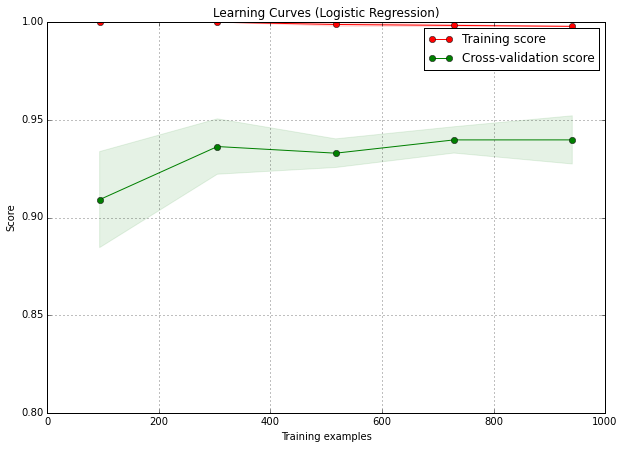

In [415]:
from sklearn.model_selection import learning_curve

def plot_learning_curve(estimator, title, X, y, ylim=None, cv=None,
                        n_jobs=1, train_sizes=np.linspace(.1, 1.0, 5)):
    plt.figure()
    plt.title(title)
    if ylim is not None:
        plt.ylim(*ylim)
    plt.xlabel("Training examples")
    plt.ylabel("Score")
    train_sizes, train_scores, test_scores = learning_curve(
        estimator, X, y, cv=cv, n_jobs=n_jobs, train_sizes=train_sizes, scoring = 'accuracy')
    train_scores_mean = np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    test_scores_mean = np.mean(test_scores, axis=1)
    test_scores_std = np.std(test_scores, axis=1)
    plt.grid()

    plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
                     train_scores_mean + train_scores_std, alpha=0.1,
                     color="r")
    plt.fill_between(train_sizes, test_scores_mean - test_scores_std,
                     test_scores_mean + test_scores_std, alpha=0.1, color="g")
    plt.plot(train_sizes, train_scores_mean, 'o-', color="r",
             label="Training score")
    plt.plot(train_sizes, test_scores_mean, 'o-', color="g",
             label="Cross-validation score")
    
    plt.ylim([0.8, 1.0])
    plt.legend(loc="best")
    return plt


title = "Learning Curves (Logistic Regression)"
# SVC is more expensive so we do a lower number of CV iterations:
cv = StratifiedKFold(np.reshape(y_train, (y_train.shape[0], )), n_folds= 5, shuffle=True, random_state=42)
estimator = KNeighborsClassifier(weights = 'distance', n_neighbors = 4, leaf_size = 20)
plot_learning_curve(estimator, title, x_train_whole_compressed, y_train, cv=cv)

plt.show()

In [416]:
"""
Test set Evaluation
"""
from sklearn.neighbors import KNeighborsClassifier
classifier = KNeighborsClassifier(weights = 'distance', n_neighbors = 4, leaf_size = 20)
classifier.fit(x_train_whole_compressed, y_train)
scores = classifier.predict(x_true_test_compressed)
print(metrics.classification_report(y_test, scores))

"""
 0.0       0.84      0.97      0.90       117
1.0       0.99      0.94      0.97       388

avg / total       0.95      0.95      0.95       505
"""

/home/nafizh/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:6: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


             precision    recall  f1-score   support

        0.0       0.84      0.95      0.89       117
        1.0       0.98      0.95      0.96       388

avg / total       0.95      0.95      0.95       505



'\n 0.0       0.84      0.97      0.90       117\n1.0       0.99      0.94      0.97       388\n\navg / total       0.95      0.95      0.95       505\n'

## Gradient Boosting Classifier - input compressed

In [456]:
"""
Grid Search for parameters
"""
from sklearn.grid_search import GridSearchCV
from xgboost import XGBClassifier

gamm = range(0,11)
max_dep = range(1, 8)
min_weight = range(1, 11)
pipe_xgb = Pipeline([('xgb', XGBClassifier())])
#param_range = [0.0001, 0.001, 0.01, 0.1, 1.0, 10.0, 100.0, 1000.0]
param_grid = [{'xgb__gamma': gamm, 'xgb__min_child_weight': max_dep, 
               'xgb__max_depth': min_weight}]

cv = StratifiedKFold(np.reshape(y_train, (y_train.shape[0], )), n_folds= 5, shuffle=True, random_state=42)
gs = GridSearchCV(estimator=pipe_xgb, param_grid=param_grid, scoring='accuracy', cv= cv)
gs = gs.fit(x_train_whole_compressed, y_train)

print(gs.best_score_)
print(gs.best_params_)

0.959252971138
{'xgb__gamma': 0, 'xgb__max_depth': 4, 'xgb__min_child_weight': 3}


In [457]:
"""
Doing cross validation and checking precision, recall, F1 score
"""
from sklearn.model_selection import cross_val_score
xgb_cl = XGBClassifier(gamma = 0, min_child_weight = 4, max_depth = 3)
cv = StratifiedKFold(np.reshape(y_train, (y_train.shape[0], )), n_folds= 5, shuffle=True, random_state=42)

f1_scores = cross_val_score(xgb_cl, x_train_whole_compressed, y_train, cv=cv, scoring = 'f1')
recall_scores = cross_val_score(xgb_cl, x_train_whole_compressed, y_train, cv=cv, scoring = 'recall')
precision_scores = cross_val_score(xgb_cl, x_train_whole_compressed, y_train, cv=cv, scoring = 'precision')

print 'F1:', f1_scores
print 'Recall:', recall_scores
print 'Precision:', precision_scores

F1: [ 0.97252747  0.97506925  0.96648045  0.97506925  0.96358543]
Recall: [ 0.97252747  0.97237569  0.9558011   0.97237569  0.95027624]
Precision: [ 0.97252747  0.97777778  0.97740113  0.97777778  0.97727273]


In [374]:
"""
This manual cross validation is done to check on performance for individual classes
(check for 0.0s in toxin prediction)
"""

#results = cross_val_score(classifier_1, x_train, y_train, cv = kfold)
from sklearn import metrics

def create_model():
    # create your model using this function
    classifier = XGBClassifier(gamma = 0, min_child_weight = 6, max_depth = 6)
    return classifier 

models_logis_c = []
def train_and_evaluate_model(model, tr, tr_l, tr_te, tr_te_l):
#     print "tr", tr.shape
#     print "tr_l", tr_l.shape
#     print "tr_te", tr_te.shape
#     print "tr_te_l", tr_te_l.shape
    model.fit(tr, tr_l)
    #tr_te = np.ravel(tr_te)
    scores = model.predict(tr_te)
    print(metrics.classification_report(tr_te_l, scores))
    #print("%s: %.2f%%" % (model.metrics_names[1], scores[1]*100))
    print 
    models_logis_c.append(model)
    # fit and evaluate here.


    
#skf = KFold(1040, n_folds=10, shuffle=True)
skf = StratifiedKFold(np.reshape(y_train, (y_train.shape[0], )), n_folds=5, shuffle=True, random_state=42)
#print skf

for i, (train, test) in enumerate(skf):
    print "Running Fold", i+1, "/", 5
    model = None # Clearing the NN.
    model = create_model()
    print train.shape, test.shape
    train_and_evaluate_model(model, x_train_whole_compressed[train], y_train[train], x_train_whole_compressed[test], 
                             y_train[test])

Running Fold 1 / 5
(941,) (237,)
             precision    recall  f1-score   support

        0.0       0.90      0.96      0.93        55
        1.0       0.99      0.97      0.98       182

avg / total       0.97      0.97      0.97       237


Running Fold 2 / 5
(942,) (236,)
             precision    recall  f1-score   support

        0.0       0.93      0.93      0.93        55
        1.0       0.98      0.98      0.98       181

avg / total       0.97      0.97      0.97       236


Running Fold 3 / 5
(943,) (235,)
             precision    recall  f1-score   support

        0.0       0.92      0.91      0.92        54
        1.0       0.97      0.98      0.98       181

avg / total       0.96      0.96      0.96       235


Running Fold 4 / 5
(943,) (235,)
             precision    recall  f1-score   support

        0.0       0.93      0.96      0.95        54
        1.0       0.99      0.98      0.98       181

avg / total       0.97      0.97      0.97       235


Runn

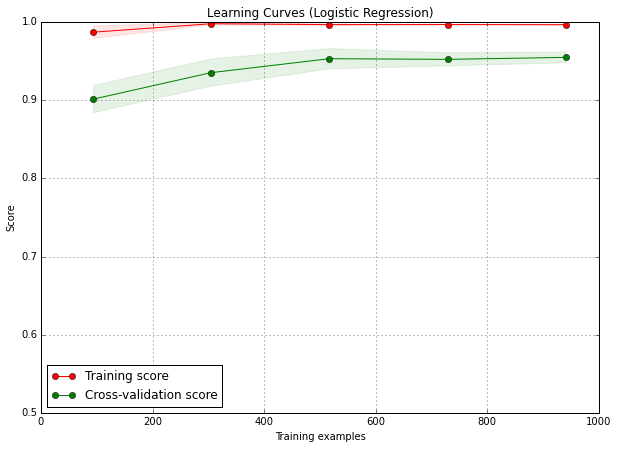

In [458]:
from sklearn.model_selection import learning_curve

def plot_learning_curve(estimator, title, X, y, ylim=None, cv=None,
                        n_jobs=1, train_sizes=np.linspace(.1, 1.0, 5)):
    plt.figure()
    plt.title(title)
    if ylim is not None:
        plt.ylim(*ylim)
    plt.xlabel("Training examples")
    plt.ylabel("Score")
    train_sizes, train_scores, test_scores = learning_curve(
        estimator, X, y, cv=cv, n_jobs=n_jobs, train_sizes=train_sizes, scoring = 'accuracy')
    train_scores_mean = np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    test_scores_mean = np.mean(test_scores, axis=1)
    test_scores_std = np.std(test_scores, axis=1)
    plt.grid()

    plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
                     train_scores_mean + train_scores_std, alpha=0.1,
                     color="r")
    plt.fill_between(train_sizes, test_scores_mean - test_scores_std,
                     test_scores_mean + test_scores_std, alpha=0.1, color="g")
    plt.plot(train_sizes, train_scores_mean, 'o-', color="r",
             label="Training score")
    plt.plot(train_sizes, test_scores_mean, 'o-', color="g",
             label="Cross-validation score")
    
    plt.ylim([0.5, 1.0])
    plt.legend(loc="best")
    return plt


title = "Learning Curves (Logistic Regression)"
# SVC is more expensive so we do a lower number of CV iterations:
cv = StratifiedKFold(np.reshape(y_train, (y_train.shape[0], )), n_folds= 5, shuffle=True, random_state=42)
estimator = XGBClassifier(gamma = 0, min_child_weight = 4, max_depth = 3)
plot_learning_curve(estimator, title, x_train_whole_compressed, y_train, cv=cv)

plt.show()

In [459]:
"""
Real test set for xgboost
"""
import xgboost
classifier = xgboost.XGBClassifier(gamma = 0, min_child_weight = 4, max_depth = 3)
classifier.fit(x_train_whole_compressed, y_train)
scores = classifier.predict(x_true_test_compressed)
print(metrics.classification_report(y_test, scores))

             precision    recall  f1-score   support

        0.0       0.96      0.93      0.94       117
        1.0       0.98      0.99      0.98       388

avg / total       0.97      0.97      0.97       505



## Logistic Regression Classifier - input compressed

In [407]:
from sklearn.grid_search import GridSearchCV

pipe_logis = Pipeline([('logis', LogisticRegression(random_state = 1))])
param_range = [0.0001, 0.001, 0.01, 0.1, 1.0, 10.0, 100.0, 1000.0]
param_grid = [{'logis__C': param_range, 'logis__penalty': ['l1']}, 
             {'logis__C': param_range, 'logis__penalty': ['l2']}]

cv = StratifiedKFold(np.reshape(y_train, (y_train.shape[0], )), n_folds= 5, shuffle=True, random_state=42)
gs = GridSearchCV(estimator=pipe_logis, param_grid=param_grid, scoring='f1', cv= cv)
gs = gs.fit(x_train_whole_compressed, y_train)

print(gs.best_score_)
print(gs.best_params_)

0.974612873768
{'logis__penalty': 'l2', 'logis__C': 0.1}


In [408]:
from sklearn.model_selection import cross_val_score
logis = LogisticRegression(C = 0.1, penalty = 'l2', random_state = 1)
cv = StratifiedKFold(np.reshape(y_train, (y_train.shape[0], )), n_folds= 5, shuffle=True, random_state=42)
f1_scores = cross_val_score(logis, x_train_whole_compressed, y_train, cv=cv, scoring = 'f1')
recall_scores = cross_val_score(logis, x_train_whole_compressed, y_train, cv=cv, scoring = 'recall')
precision_scores = cross_val_score(logis, x_train_whole_compressed, y_train, cv=cv, scoring = 'precision')

print 'F1:', f1_scores
print 'Recall:', recall_scores
print 'Precision:', precision_scores

"""
F1: [ 0.98071625  0.98060942  0.96952909  0.98342541  0.95890411]
Recall: [ 0.97802198  0.97790055  0.96685083  0.98342541  0.96685083]
Precision: [ 0.98342541  0.98333333  0.97222222  0.98342541  0.95108696]
"""

F1: [ 0.98071625  0.98060942  0.97222222  0.97790055  0.96153846]
Recall: [ 0.97802198  0.97790055  0.96685083  0.97790055  0.96685083]
Precision: [ 0.98342541  0.98333333  0.97765363  0.97790055  0.95628415]


'\nF1: [ 0.98071625  0.98060942  0.96952909  0.98342541  0.95890411]\nRecall: [ 0.97802198  0.97790055  0.96685083  0.98342541  0.96685083]\nPrecision: [ 0.98342541  0.98333333  0.97222222  0.98342541  0.95108696]\n'

In [409]:
#results = cross_val_score(classifier_1, x_train, y_train, cv = kfold)
from sklearn import metrics
from sklearn.linear_model import LogisticRegression

def create_model():
    # create your model using this function
    classifier = LogisticRegression(C = 0.1, penalty = 'l2', random_state = 1)
    return classifier 

models_logis_c = []
def train_and_evaluate_model(model, tr, tr_l, tr_te, tr_te_l):
#     print "tr", tr.shape
#     print "tr_l", tr_l.shape
#     print "tr_te", tr_te.shape
#     print "tr_te_l", tr_te_l.shape
    model.fit(tr, tr_l)
    #tr_te = np.ravel(tr_te)
    scores = model.predict(tr_te)
    print(metrics.classification_report(tr_te_l, scores))
    #print("%s: %.2f%%" % (model.metrics_names[1], scores[1]*100))
    print 
    models_logis_c.append(model)
    # fit and evaluate here.


    
#skf = KFold(1040, n_folds=10, shuffle=True)
skf = StratifiedKFold(np.reshape(y_train, (y_train.shape[0], )), n_folds=5, shuffle=True, random_state=42)
#print skf

for i, (train, test) in enumerate(skf):
    print "Running Fold", i+1, "/", 5
    model = None # Clearing the NN.
    model = create_model()
    print train.shape, test.shape
    train_and_evaluate_model(model, x_train_whole_compressed[train], y_train[train], x_train_whole_compressed[test], 
                             y_train[test])

Running Fold 1 / 5
(941,) (237,)
             precision    recall  f1-score   support

        0.0       0.93      0.95      0.94        55
        1.0       0.98      0.98      0.98       182

avg / total       0.97      0.97      0.97       237


Running Fold 2 / 5
(942,) (236,)
             precision    recall  f1-score   support

        0.0       0.93      0.95      0.94        55
        1.0       0.98      0.98      0.98       181

avg / total       0.97      0.97      0.97       236


Running Fold 3 / 5
(943,) (235,)
             precision    recall  f1-score   support

        0.0       0.89      0.93      0.91        54
        1.0       0.98      0.97      0.97       181

avg / total       0.96      0.96      0.96       235


Running Fold 4 / 5
(943,) (235,)
             precision    recall  f1-score   support

        0.0       0.93      0.93      0.93        54
        1.0       0.98      0.98      0.98       181

avg / total       0.97      0.97      0.97       235


Runn

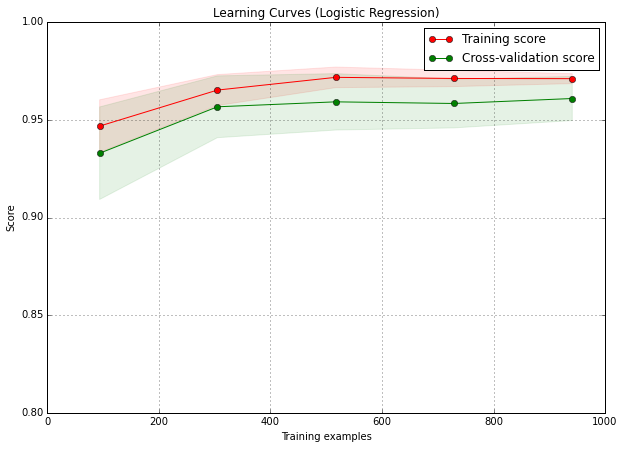

In [410]:
from sklearn.model_selection import learning_curve

def plot_learning_curve(estimator, title, X, y, ylim=None, cv=None,
                        n_jobs=1, train_sizes=np.linspace(.1, 1.0, 5)):
    plt.figure()
    plt.title(title)
    if ylim is not None:
        plt.ylim(*ylim)
    plt.xlabel("Training examples")
    plt.ylabel("Score")
    plt.ylim([0.0, 1.0])
    train_sizes, train_scores, test_scores = learning_curve(
        estimator, X, y, cv=cv, n_jobs=n_jobs, train_sizes=train_sizes, scoring = 'accuracy')
    train_scores_mean = np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    test_scores_mean = np.mean(test_scores, axis=1)
    test_scores_std = np.std(test_scores, axis=1)
    plt.grid()

    plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
                     train_scores_mean + train_scores_std, alpha=0.1,
                     color="r")
    plt.fill_between(train_sizes, test_scores_mean - test_scores_std,
                     test_scores_mean + test_scores_std, alpha=0.1, color="g")
    plt.plot(train_sizes, train_scores_mean, 'o-', color="r",
             label="Training score")
    plt.plot(train_sizes, test_scores_mean, 'o-', color="g",
             label="Cross-validation score")
    
    plt.ylim([0.8, 1.0])
    plt.legend(loc="best")
    return plt


title = "Learning Curves (Logistic Regression)"
# SVC is more expensive so we do a lower number of CV iterations:
cv = StratifiedKFold(np.reshape(y_train, (y_train.shape[0], )), n_folds= 5, shuffle=True, random_state=42)
estimator = LogisticRegression(C = 0.1, penalty = 'l2', random_state = 1)
plot_learning_curve(estimator, title, x_train_whole_compressed, y_train, cv=cv)

plt.show()

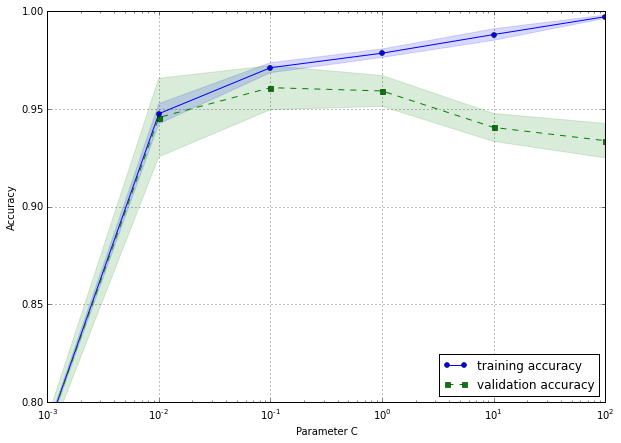

In [411]:
"""
Validation curve: Checking for which value of C logistic regression
gives the best result
"""

from sklearn.learning_curve import validation_curve
param_range = [0.001, 0.01, 0.1, 1.0, 10.0, 100.0]

pipe_lr = Pipeline([('logis', LogisticRegression(C = 0.1, penalty = 'l2', random_state = 1))])
cv = StratifiedKFold(np.reshape(y_train, (y_train.shape[0], )), n_folds= 5, shuffle=True, random_state=42)
train_scores, test_scores = validation_curve(estimator=pipe_lr, X=x_train_whole_compressed, y=y_train, param_name='logis__C',
                                            param_range=param_range, cv=cv)
train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)
test_std = np.std(test_scores, axis=1)
plt.plot(param_range, train_mean,
 color='blue', marker='o',
 markersize=5,
 label='training accuracy')
plt.fill_between(param_range, train_mean + train_std,
 train_mean - train_std, alpha=0.15,
 color='blue')
plt.plot(param_range, test_mean,
    color='green', linestyle='--',
    marker='s', markersize=5,
    label='validation accuracy')
plt.fill_between(param_range,
    test_mean + test_std,
    test_mean - test_std,
    alpha=0.15, color='green')
plt.grid()
plt.xscale('log')
plt.legend(loc='lower right')
plt.xlabel('Parameter C')
plt.ylabel('Accuracy')
plt.ylim([0.8, 1.0])
plt.show()

             precision    recall  f1-score   support

        0.0       0.92      0.86      0.89        90
        1.0       0.96      0.98      0.97       299

avg / total       0.95      0.95      0.95       389



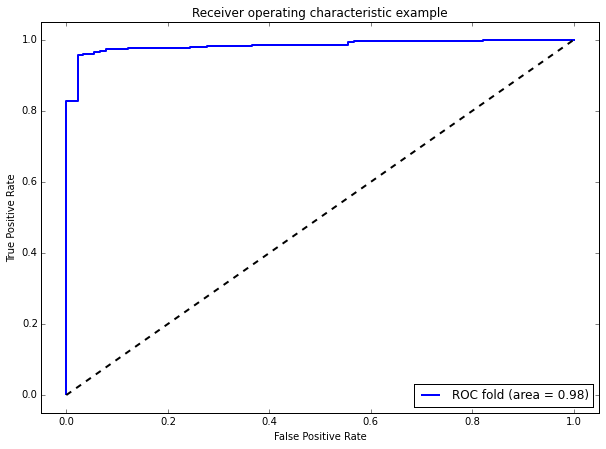

In [319]:
"""
On Test Set
"""
from sklearn.metrics import roc_curve, auc

classifier = LogisticRegression()
classifier.fit(x_train_compressed, y_train_a)
scores = classifier.predict(x_test_compressed)
print(metrics.classification_report(y_train_val_a, scores))

logi_prob_c = classifier.predict_proba(x_test_compressed)

fpr, tpr, thresholds = roc_curve(y_train_val_a, logi_prob_c[:, 1], pos_label = 1)
roc_auc = auc(fpr, tpr)
plt.plot(fpr, tpr, lw=2, color= 'blue',
         label='ROC fold (area = %0.2f)' % (roc_auc))
plt.xlim([-0.05, 1.05])
plt.ylim([-0.05, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic example')
plt.legend(loc="lower right")
plt.plot([0, 1], [0, 1], linestyle='--', lw=2, color='k',
         label='Luck')
plt.show()

In [412]:
"""
Test set Evaluation
"""
from sklearn.linear_model import LogisticRegression
classifier = LogisticRegression(C = 0.1, penalty = 'l2', random_state = 1)
classifier.fit(x_train_whole_compressed, y_train)
scores = classifier.predict(x_true_test_compressed)
print(metrics.classification_report(y_test, scores))

             precision    recall  f1-score   support

        0.0       0.93      0.92      0.93       117
        1.0       0.98      0.98      0.98       388

avg / total       0.97      0.97      0.97       505



In [121]:
def find_optimal_cutoff(target, predicted):
    fpr, tpr, threshold = roc_curve(target, predicted)
    i = np.arange(len(tpr)) 
    roc = pd.DataFrame({'tf' : pd.Series(tpr-(1-fpr), index=i), 'threshold' : pd.Series(threshold, index=i)})
    roc_t = roc.ix[(roc.tf-0).abs().argsort()[:1]]

    return list(roc_t['threshold']) 

# Find optimal probability threshold
#scores = models_logis_c[2].predict(x_train_compressed)
temp_mod = LogisticRegression()
temp_mod.fit(np.vstack((x_train_compressed, x_test_compressed)), np.vstack((y_train_a, y_train_val_a)))
logi_prob_c = temp_mod.predict_proba(np.vstack((x_train_compressed, x_test_compressed)))
threshold = find_optimal_cutoff(np.vstack((y_train_a, y_train_val_a)), logi_prob_c[:, 1])
print threshold
#print logi_prob_c[:, 1]

[0.55772344134211771]


## SVM with input compressed

In [22]:
from sklearn.grid_search import GridSearchCV
from sklearn.svm import SVC

pipe_svc = Pipeline([('clf', SVC(random_state=1))])
param_range = [0.0001, 0.001, 0.01, 0.1, 1.0, 10.0, 100.0, 1000.0]
param_grid = [{'clf__C': param_range, 'clf__kernel': ['linear']}, {'clf__C': param_range, 
             'clf__gamma': param_range, 'clf__kernel': ['rbf']}]

cv = StratifiedKFold(np.reshape(y_train, (y_train.shape[0], )), n_folds= 5, shuffle=True, random_state=42)
gs = GridSearchCV(estimator=pipe_svc, param_grid=param_grid, scoring='f1', cv= cv)
gs = gs.fit(x_train_whole_compressed, y_train)

print(gs.best_score_)
print(gs.best_params_)

/home/nafizh/anaconda/lib/python2.7/site-packages/sklearn/utils/validation.py:526: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


0.979994500296
{'clf__gamma': 0.1, 'clf__C': 1.0, 'clf__kernel': 'rbf'}


In [23]:
from sklearn.model_selection import cross_val_score
clf = SVC(gamma = 0.1, C = 1.0, kernel = 'rbf', random_state=1)
cv = StratifiedKFold(np.reshape(y_train, (y_train.shape[0], )), n_folds= 5, shuffle=True, random_state=42)
f1_scores = cross_val_score(clf, x_train_whole_compressed, y_train, cv=cv, scoring = 'f1')
recall_scores = cross_val_score(clf, x_train_whole_compressed, y_train, cv=cv, scoring = 'recall')
precision_scores = cross_val_score(clf, x_train_whole_compressed, y_train, cv=cv, scoring = 'precision')

print 'F1:', f1_scores
print 'Recall:', recall_scores
print 'Precision:', precision_scores

F1: [ 0.98060942  0.98333333  0.97493036  0.98614958  0.97493036]
Recall: [ 0.97252747  0.97790055  0.96685083  0.98342541  0.96685083]
Precision: [ 0.98882682  0.98882682  0.98314607  0.98888889  0.98314607]


In [433]:
#results = cross_val_score(classifier_1, x_train, y_train, cv = kfold)
from sklearn.svm import SVC
from sklearn import metrics

def create_model():
    # create your model using this function
    classifier = SVC(gamma = 0.1, C = 1.0, kernel = 'rbf', random_state=1)
    return classifier 

models_svm_c = []
def train_and_evaluate_model(model, tr, tr_l, tr_te, tr_te_l):
#     print "tr", tr.shape
#     print "tr_l", tr_l.shape
#     print "tr_te", tr_te.shape
#     print "tr_te_l", tr_te_l.shape
    model.fit(tr, tr_l)
    #tr_te = np.ravel(tr_te)
    scores = model.predict(tr_te)
    print(metrics.classification_report(tr_te_l, scores))
    #print("%s: %.2f%%" % (model.metrics_names[1], scores[1]*100))
    print 
    models_svm_c.append(model)
    # fit and evaluate here.


    
#skf = KFold(1040, n_folds=10, shuffle=True)
skf = StratifiedKFold(np.reshape(y_train, (y_train.shape[0], )), n_folds= 5, shuffle=True, random_state=42)
#print skf

for i, (train, test) in enumerate(skf):
    print "Running Fold", i+1, "/", 5
    model = None # Clearing the NN.
    model = create_model()
    print train.shape, test.shape
    train_and_evaluate_model(model, x_train_whole_compressed[train], y_train[train], x_train_whole_compressed[test], 
                             y_train[test])

Running Fold 1 / 5
(941,) (237,)
             precision    recall  f1-score   support

        0.0       0.91      0.96      0.94        55
        1.0       0.99      0.97      0.98       182

avg / total       0.97      0.97      0.97       237


Running Fold 2 / 5
(942,) (236,)
             precision    recall  f1-score   support

        0.0       0.91      0.96      0.94        55
        1.0       0.99      0.97      0.98       181

avg / total       0.97      0.97      0.97       236


Running Fold 3 / 5
(943,) (235,)
             precision    recall  f1-score   support

        0.0       0.90      0.96      0.93        54
        1.0       0.99      0.97      0.98       181

avg / total       0.97      0.97      0.97       235


Running Fold 4 / 5
(943,) (235,)
             precision    recall  f1-score   support

        0.0       0.93      1.00      0.96        54
        1.0       1.00      0.98      0.99       181

avg / total       0.98      0.98      0.98       235


Runn

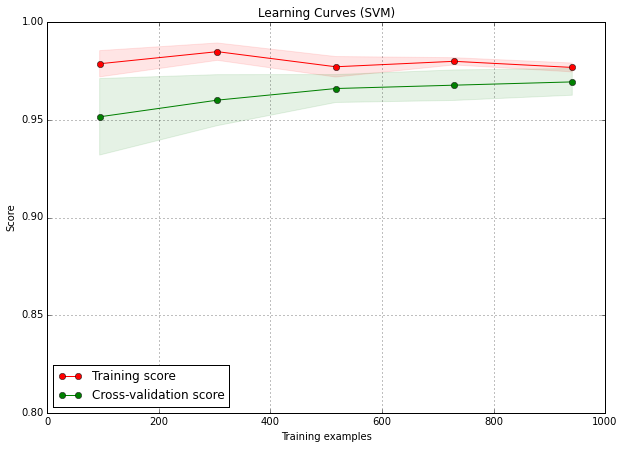

In [24]:
from sklearn.model_selection import learning_curve

def plot_learning_curve(estimator, title, X, y, ylim=None, cv=None,
                        n_jobs=1, train_sizes=np.linspace(.1, 1.0, 5)):
    plt.figure()
    plt.title(title)
    if ylim is not None:
        plt.ylim(*ylim)
    plt.xlabel("Training examples")
    plt.ylabel("Score")
    train_sizes, train_scores, test_scores = learning_curve(
        estimator, X, y, cv=cv, n_jobs=n_jobs, train_sizes=train_sizes, scoring = 'accuracy')
    train_scores_mean = np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    test_scores_mean = np.mean(test_scores, axis=1)
    test_scores_std = np.std(test_scores, axis=1)
    plt.grid()

    plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
                     train_scores_mean + train_scores_std, alpha=0.1,
                     color="r")
    plt.fill_between(train_sizes, test_scores_mean - test_scores_std,
                     test_scores_mean + test_scores_std, alpha=0.1, color="g")
    plt.plot(train_sizes, train_scores_mean, 'o-', color="r",
             label="Training score")
    plt.plot(train_sizes, test_scores_mean, 'o-', color="g",
             label="Cross-validation score")
    plt.ylim([0.8, 1.0])

    plt.legend(loc="best")
    return plt


title = "Learning Curves (SVM)"
# SVC is more expensive so we do a lower number of CV iterations:
cv = StratifiedKFold(np.reshape(y_train, (y_train.shape[0], )), n_folds= 5, shuffle=True, random_state=42)
estimator = SVC(gamma = 0.1, C = 1.0, kernel = 'rbf', random_state=1)
plot_learning_curve(estimator, title, x_train_whole_compressed, y_train, cv=cv)

plt.show()

In [25]:
"""
Test set Evaluation
"""
from sklearn.svm import SVC
from sklearn import metrics
classifier = SVC(gamma = 0.1, C = 1.0, kernel = 'rbf', random_state=1)
classifier.fit(x_train_whole_compressed, y_train)
scores = classifier.predict(x_true_test_compressed)
print(metrics.classification_report(y_test, scores))

             precision    recall  f1-score   support

        0.0       0.93      0.97      0.95       117
        1.0       0.99      0.98      0.99       388

avg / total       0.98      0.98      0.98       505



## Vanilla NN classifier where Input is compressed

In [389]:
#x_train_c, x_test_c = X_main[:1040,:], X_main[1040:1680 ,:]
#y_train_c, y_test_c = y_main[:1040, :], y_main[1040:1680 , :]
x_train_compressed = encoder.predict(x_train_a, batch_size = 100)
print x_train_compressed.shape
x_test_compressed = encoder.predict(x_train_val_a, batch_size = 100)
print x_test_compressed.shape

(789, 256)
(389, 256)


In [373]:
#results = cross_val_score(classifier_1, x_train, y_train, cv = kfold)
drops = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]
def create_model(dropout_rate, hid_neu_num):
    # create your model using this function
    classifier_1 = None
    classifier_1 = Sequential()
    #classifier_1.add(Dense(2, input_shape=(2,)))
    classifier_1.add(Dropout(dropout_rate, input_shape = (256, )))
    classifier_1.add(Dense(hid_neu_num, activation = 'relu'))
    #classifier_1.add(Dropout(0.4))
    classifier_1.add(Dense(1, activation = 'sigmoid'))
    classifier_1.compile(loss= 'binary_crossentropy', optimizer= 'adam', metrics=['accuracy'])
    return classifier_1

models_nn_compressed = []
train_val_error_list_compressed = []

def train_and_evaluate_model(model, tr, tr_l, tr_te, tr_te_l):
    hist = model.fit(tr, tr_l, nb_epoch= 800, batch_size= 160, verbose=0, validation_data = (tr_te, tr_te_l))
    #print hist.history
    train_val_error_list_compressed.append(hist.history)
    #scores = model.evaluate(tr_te, tr_te_l)
    print
#     model.fit(tr, tr_l, nb_epoch=200, batch_size=80, verbose=0)
    scores = model.predict_classes(tr_te)
    print
    print(metrics.classification_report(tr_te_l, scores))
    #print("%s: %.2f%%" % (model.metrics_names[1], scores[1]*100))
    #print model.metrics_names
    models_nn_compressed.append(model)
    # fit and evaluate here.


    
skf_c = StratifiedKFold(np.reshape(y_train_a, (y_train_a.shape[0], )), n_folds=3, shuffle=True, random_state=42)

#for drop_ in drops:
for i, (train, test) in enumerate(skf_c):
    #print "Running Fold", i+1, "/", 3
    model = None # Clearing the NN.
    #print "Dropout: ", drop_, " Neuron num: ", 3
    model = create_model(0.6, 3)
    print train.shape, test.shape
    train_and_evaluate_model(model, x_train_compressed[train], y_train_a[train], x_train_compressed[test], 
                             y_train_a[test])

(525,) (264,)

 32/264 [==>...........................] - ETA: 0s
             precision    recall  f1-score   support

        0.0       0.84      0.95      0.89        61
        1.0       0.98      0.95      0.96       203

avg / total       0.95      0.95      0.95       264

(526,) (263,)

 32/263 [==>...........................] - ETA: 0s
             precision    recall  f1-score   support

        0.0       0.79      0.95      0.87        61
        1.0       0.98      0.93      0.95       202

avg / total       0.94      0.93      0.93       263

(527,) (262,)

 32/262 [==>...........................] - ETA: 0s
             precision    recall  f1-score   support

        0.0       0.96      0.92      0.94        60
        1.0       0.98      0.99      0.98       202

avg / total       0.97      0.97      0.97       262



KeyError: 'val_acc'

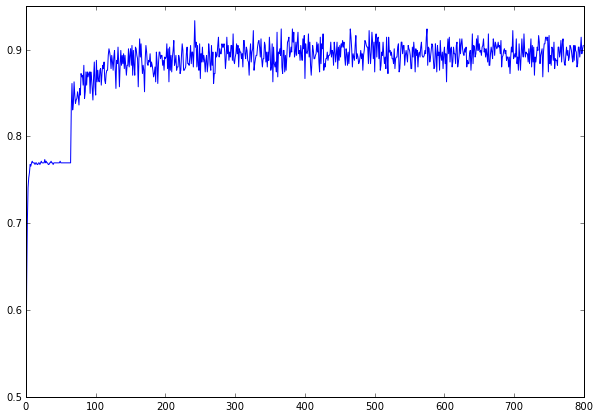

In [312]:
plt.plot(train_val_error_list_compressed[0]['acc'])
plt.plot(train_val_error_list_compressed[0]['val_acc'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()
# # summarize history for loss
# plt.plot(train_val_error_list[0]['loss'])
# plt.plot(train_val_error_list[0]['val_loss'])
# plt.title('model loss')
# plt.ylabel('loss')
# plt.xlabel('epoch')
# plt.legend(['train', 'val'], loc='upper left')
# plt.show()

plt.plot(train_val_error_list_compressed[1]['acc'])
plt.plot(train_val_error_list_compressed[1]['val_acc'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

plt.plot(train_val_error_list_compressed[2]['acc'])
plt.plot(train_val_error_list_compressed[2]['val_acc'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

In [374]:
classifier_1 = Sequential()
#classifier_1.add(Dense(2, input_shape=(2,)))
classifier_1.add(Dropout(0.6, input_shape = (256, )))
classifier_1.add(Dense(3, activation = 'relu'))
#classifier_1.add(Dropout(0.4))
classifier_1.add(Dense(1, activation = 'sigmoid'))
classifier_1.compile(loss= 'binary_crossentropy', optimizer= 'adam', metrics=['accuracy'])

hist = classifier_1.fit(x_train_compressed, y_train_a, nb_epoch= 1200, batch_size= 160, verbose=0)
scores = classifier_1.predict_classes(x_test_compressed)
print
print(metrics.classification_report(y_train_val_a, scores))

 32/389 [=>............................] - ETA: 0s
             precision    recall  f1-score   support

        0.0       0.90      0.84      0.87        90
        1.0       0.95      0.97      0.96       299

avg / total       0.94      0.94      0.94       389



In [130]:
classifier_1 = Sequential()
#classifier_1.add(Dense(2, input_shape=(2,)))
classifier_1.add(Dropout(0.5, input_shape = (256, )))
classifier_1.add(Dense(3, activation = 'relu'))
#classifier_1.add(Dropout(0.4))
classifier_1.add(Dense(1, activation = 'sigmoid'))
classifier_1.compile(loss= 'binary_crossentropy', optimizer= 'adam', metrics=['accuracy'])

hist = classifier_1.fit(x_train_whole_compressed, y_train, nb_epoch= 1200, batch_size= 160, verbose=0)
scores = classifier_1.predict_classes(x_true_test_compressed)
print
print(metrics.classification_report(y_test, scores))

 32/505 [>.............................] - ETA: 0s
             precision    recall  f1-score   support

        0.0       0.83      0.97      0.90       117
        1.0       0.99      0.94      0.97       388

avg / total       0.95      0.95      0.95       505



In [590]:
"""
On Test Set
"""
scores = models_nn_compressed[1].predict_classes(x_test_compressed)
print
print(metrics.classification_report(y_test, scores))
scores = models_nn_compressed[1].predict_classes(x_train_compressed)
print
print(metrics.classification_report(y_train, scores))

 32/505 [>.............................] - ETA: 0s
             precision    recall  f1-score   support

        0.0       0.84      0.91      0.87       117
        1.0       0.97      0.95      0.96       388

avg / total       0.94      0.94      0.94       505

  32/1178 [..............................] - ETA: 0s
             precision    recall  f1-score   support

        0.0       0.80      0.90      0.85       272
        1.0       0.97      0.93      0.95       906

avg / total       0.93      0.92      0.93      1178



In [36]:
def baseline_model():
    classifier = Sequential()
    classifier.add(Dense(5, input_dim = 6860, activation = 'relu'))
    classifier.add(Dense(1, activation = 'sigmoid'))
    classifier.compile(loss= 'binary_crossentropy', optimizer= 'adam', metrics=['accuracy'])
    return classifier

In [30]:
scores = classifier.evaluate(x_main_compressed, y_main)
print("%s: %.2f%%" % (classifier.metrics_names[1], scores[1]*100))

1568/1680 [===========================>..] - ETA: 0sacc: 91.90%


In [37]:
estimator = KerasClassifier(build_fn = baseline_model, nb_epoch = 200, batch_size = 80, verbose=0)

In [38]:
kfold = KFold(n_splits=10, shuffle=True, random_state=0)

In [39]:
results = cross_val_score(estimator, X_main, y_main, cv = kfold)

print("Accuracy: %.2f%% (%.2f%%)" % (results.mean()*100, results.std()*100))

Accuracy: 93.87% (1.81%)


## Denoising Autoencoder

In [10]:
from keras.layers import Input, Dense
from keras.models import Model
from keras.layers import GaussianNoise
from keras import regularizers
from keras.regularizers import l2, activity_l2, l1, activity_l1
# this is the size of our encoded representations
autoencoder = None
encoding_dim = 256  # 32 floats -> compression of factor 24.5, assuming the input is 784 floats

# this is our input placeholder
input_img = Input(shape=(8000,))
encoded = GaussianNoise(0.3)(input_img) #0.3
encoded = Dropout(0.3)(encoded) #0.3
# "encoded" is the encoded representation of the input
encoded = Dense(encoding_dim, activation='sigmoid', init = 'uniform')(encoded)
#encoded = Dense(encoding_dim, activation='sigmoid', init = 'uniform', W_regularizer=l1(0.1))(input_img)

# "decoded" is the lossy reconstruction of the input
#encoded = Dropout(0.90)(encoded)
decoded = Dense(8000, activation = 'sigmoid')(encoded)

# this model maps an input to its reconstruction
autoencoder = Model(input=input_img, output=decoded)

# input_img = Input(shape=(6860,))
# encoded = Dense(128, activation='relu', activity_regularizer=regularizers.activity_l1(10e-5))(input_img)
# encoded = Dense(64, activation='relu')(encoded)
# encoded = Dense(32, activation='relu')(encoded)

# decoded = Dense(64, activation='relu')(encoded)
# decoded = Dense(128, activation='relu')(decoded)
# decoded = Dense(6860, activation='sigmoid')(decoded)

# autoencoder = Model(input=input_img, output=decoded)

In [11]:
# this model maps an input to its encoded representation
encoder = Model(input=input_img, output=encoded)

In [12]:
# create a placeholder for an encoded (32-dimensional) input
encoded_input = Input(shape=(encoding_dim,))
# retrieve the last layer of the autoencoder model
decoder_layer = autoencoder.layers[-1]
# create the decoder model
decoder = Model(input=encoded_input, output=decoder_layer(encoded_input))


# # create a placeholder for an encoded (32-dimensional) input
# encoded_input_1 = Input(shape=(32,))
# encoded_input_2 = Input(shape=(64,))
# encoded_input_3 = Input(shape=(128,))
# # retrieve the last layer of the autoencoder model
# decoder_layer_1 = autoencoder.layers[-3]
# decoder_layer_2 = autoencoder.layers[-2]
# decoder_layer_3 = autoencoder.layers[-1]
# # create the decoder model
# decoder_1 = Model(input = encoded_input_1, output = decoder_layer_1(encoded_input_1))
# decoder_2 = Model(input = encoded_input_2, output = decoder_layer_2(encoded_input_2))
# decoder_3 = Model(input = encoded_input_3, output = decoder_layer_3(encoded_input_3))

In [13]:
autoencoder.compile(optimizer='adagrad', loss='mse')

In [14]:
x_train_a, x_train_val_a, y_train_a, y_train_val_a = train_test_split(x_train, y_train, test_size=0.33, random_state=42, 
                                                   stratify = y_train)
print x_train_a.shape
print x_train_val_a.shape

(789, 8000)
(389, 8000)


In [15]:
import time
tic = time.time()

hist = autoencoder.fit(x_train_a, x_train_a,
                nb_epoch= 800,
                batch_size= 128,
                shuffle=True,
               verbose = True,
               validation_data=(x_train_val_a, x_train_val_a))
toc = time.time()
print "computed in %fs" % (toc - tic)

Train on 789 samples, validate on 389 samples
Epoch 1/800
789/789 [==============================] - 0s - loss: 0.0857 - val_loss: 0.0372
Epoch 2/800
789/789 [==============================] - 0s - loss: 0.0399 - val_loss: 0.0361
Epoch 3/800
789/789 [==============================] - 0s - loss: 0.0390 - val_loss: 0.0355
Epoch 4/800
789/789 [==============================] - 0s - loss: 0.0382 - val_loss: 0.0350
Epoch 5/800
789/789 [==============================] - 0s - loss: 0.0377 - val_loss: 0.0347
Epoch 6/800
789/789 [==============================] - 0s - loss: 0.0373 - val_loss: 0.0345
Epoch 7/800
789/789 [==============================] - 0s - loss: 0.0370 - val_loss: 0.0342
Epoch 8/800
789/789 [==============================] - 0s - loss: 0.0367 - val_loss: 0.0342
Epoch 9/800
789/789 [==============================] - 0s - loss: 0.0365 - val_loss: 0.0340
Epoch 10/800
789/789 [==============================] - 0s - loss: 0.0363 - val_loss: 0.0340
Epoch 11/800
789/789 [===========

In [16]:
# encode and decode some digits
# note that we take them from the *test* set
encoded_imgs = encoder.predict(x_train_val_a)
decoded_imgs = decoder.predict(encoded_imgs)

# # encode and decode some digits
# # note that we take them from the *test* set
# encoded_imgs = encoder.predict(x_test)
# decoded_imgs = decoder_1.predict(encoded_imgs)
# decoded_imgs = decoder_2.predict(decoded_imgs)
# decoded_imgs = decoder_3.predict(decoded_imgs)

In [17]:
print encoded_imgs.shape
print decoded_imgs.shape

(389, 256)
(389, 8000)


In [18]:
from sklearn.decomposition import TruncatedSVD
from sklearn.manifold import TSNE

encoded_imgs = encoder.predict(x_train)
X_reduced = TruncatedSVD(n_components=10, random_state=0).fit_transform(encoded_imgs)
X_embedded = TSNE(n_components=2, perplexity=40, verbose=2).fit_transform(X_reduced)

#X_embedded = TSNE(n_components=2, perplexity=40, verbose=2).fit_transform(encoded_imgs)
vis_x = X_embedded[:, 0]
vis_y = X_embedded[:, 1]

[t-SNE] Computing pairwise distances...
[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Computed conditional probabilities for sample 1000 / 1178
[t-SNE] Computed conditional probabilities for sample 1178 / 1178
[t-SNE] Mean sigma: 0.719820
[t-SNE] Iteration 25: error = 1.2482252, gradient norm = 0.0062327
[t-SNE] Iteration 50: error = 1.1446772, gradient norm = 0.0064175
[t-SNE] Iteration 75: error = 0.8876078, gradient norm = 0.0019032
[t-SNE] Iteration 100: error = 0.8584303, gradient norm = 0.0024110
[t-SNE] KL divergence after 100 iterations with early exaggeration: 0.858430
[t-SNE] Iteration 125: error = 0.8017110, gradient norm = 0.0007858
[t-SNE] Iteration 125: gradient norm 0.000786. Finished.
[t-SNE] Error after 125 iterations: 0.858430


/home/nafizh/anaconda/lib/python2.7/site-packages/matplotlib/collections.py:590: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if self._edgecolors == str('face'):


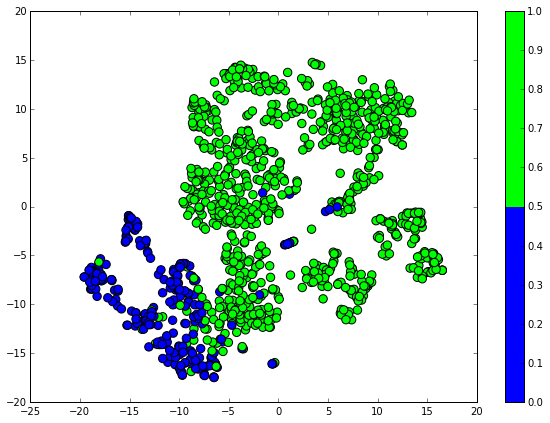

In [19]:
# display a 2D plot of the digit classes in the latent space
# plt.cm.get_cmap("brg", 3)
#import matplotlib
#x_test_encoded = encoder.predict(x_test)
#print x_test_encoded.shape
#colors = ['red','green','blue','purple']
plt.scatter(vis_x, vis_y, c=y_train, cmap = plt.cm.get_cmap("brg", 2), s = 70)
#plt.scatter(encoded_imgs[:, 0], encoded_imgs[:, 1], c=y_train_val_a, cmap = plt.cm.get_cmap("brg", 3), s = 70)
#plt.scatter(vis_x, vis_y, s = 70)
plt.colorbar()
plt.show()

In [20]:
"""
Encoding the training and test data with the prepared autoencoder
"""

x_true_test_compressed = encoder.predict(x_test, batch_size = 100)
print x_true_test_compressed.shape
x_train_whole_compressed = encoder.predict(x_train, batch_size = 100)
print x_train_whole_compressed.shape

(505, 256)
(1178, 256)


In [243]:
#print hist.history['val_loss'][398]


gauss_noise = [0.0, 0.1, 0.3, 0.5, 0.7, 1.0, 1.3, 1.5, 1.7, 2.0, 2.5, 3.0, 3.5, 4.0]
drop_out = [0.0, 0.1, 0.3, 0.5, 0.7, 0.9, 0.95]
encoding_dim_list = [512, 256, 128]
hidden_activation_func = ['relu', 'sigmoid']
output_activation_func = ['sigmoid', 'linear']

loss_dict = defaultdict(list)

for gauss in gauss_noise:
    for drop_ in drop_out:
        for en_dim in encoding_dim_list:
            for hidden_act_func in hidden_activation_func:
                for out_act_func in output_activation_func:
                    # this is the size of our encoded representations
                    print "Noise: ",gauss, "-Dropout: ",drop_, "-Hidden layer: ",en_dim, \
                    "-H layer func: ", hidden_act_func, "-Out layer func: ", out_act_func
                    autoencoder = None
                    encoding_dim = en_dim  # 32 floats -> compression of factor 24.5, assuming the input is 784 floats

                    # this is our input placeholder
                    input_img = Input(shape=(8000,))
                    encoded = GaussianNoise(gauss)(input_img)
                    encoded = Dropout(drop_)(encoded) #Recall 1 was with 0.95
                    # "encoded" is the encoded representation of the input
                    encoded = Dense(encoding_dim, activation= hidden_act_func)(encoded)
                    #encoded = Dense(encoding_dim, activation='sigmoid', init = 'uniform', W_regularizer=l1(0.1))(input_img)

                    # "decoded" is the lossy reconstruction of the input
                    #encoded = Dropout(0.90)(encoded)
                    decoded = Dense(8000, activation = out_act_func)(encoded)

                    # this model maps an input to its reconstruction
                    autoencoder = Model(input=input_img, output=decoded)

                    encoder = Model(input=input_img, output=encoded)
                    # create a placeholder for an encoded (32-dimensional) input
                    encoded_input = Input(shape=(encoding_dim,))
                    # retrieve the last layer of the autoencoder model
                    decoder_layer = autoencoder.layers[-1]
                    # create the decoder model
                    decoder = Model(input=encoded_input, output=decoder_layer(encoded_input))
                    autoencoder.compile(optimizer='adagrad', loss='mse')

                    hist = autoencoder.fit(x_train_a, x_train_a,
                                    nb_epoch= 400,
                                    batch_size= 128,
                                    shuffle=True,
                                   verbose = False,
                                   validation_data=(x_train_val_a, x_train_val_a))

                    print "training loss: ", hist.history['loss'][399], "validation loss: ", hist.history['val_loss'][399]
                    print
                    loss_dict[(gauss, drop_, en_dim, hidden_act_func, out_act_func)] = [hist.history['loss'][399], hist.history['val_loss'][399]]



Noise:  0.0 -Dropout:  0.0 -Hidden layer:  512 -H layer func:  relu -Out layer func:  sigmoid
training loss:  0.00638368917707 validation loss:  0.0322259603198

Noise:  0.0 -Dropout:  0.0 -Hidden layer:  512 -H layer func:  relu -Out layer func:  linear
training loss:  0.0318625145067 validation loss:  0.0321067491101

Noise:  0.0 -Dropout:  0.0 -Hidden layer:  512 -H layer func:  sigmoid -Out layer func:  sigmoid
training loss:  0.0144022382945 validation loss:  0.0300229388244

Noise:  0.0 -Dropout:  0.0 -Hidden layer:  512 -H layer func:  sigmoid -Out layer func:  linear
training loss:  0.00346253388791 validation loss:  0.0348468297341

Noise:  0.0 -Dropout:  0.0 -Hidden layer:  256 -H layer func:  relu -Out layer func:  sigmoid
training loss:  0.0338097868962 validation loss:  0.0350005099536

Noise:  0.0 -Dropout:  0.0 -Hidden layer:  256 -H layer func:  relu -Out layer func:  linear
training loss:  0.0322360318716 validation loss:  0.0321312716714

Noise:  0.0 -Dropout:  0.0 -H

KeyboardInterrupt: 

In [362]:
min_val = 100000
for key, val in loss_dict.items():
    if key[-1] == 'sigmoid' and key[2] == 256:
        if val[1] < 0.032:
            min_val = val[1]
            print min_val, val[0]
            print key

print min_val

0.0313549791499 0.0288842020318
(0.3, 0.1, 256, 'sigmoid', 'sigmoid')
0.0319304944023 0.0300621515463
(0.3, 0.5, 256, 'sigmoid', 'sigmoid')
0.0318100836252 0.0289275883514
(0.1, 0.1, 256, 'sigmoid', 'sigmoid')
0.031735334847 0.0298493297414
(0.5, 0.0, 256, 'sigmoid', 'sigmoid')
0.0316905816323 0.0290081004774
(0.1, 0.3, 256, 'sigmoid', 'sigmoid')
0.0313143218391 0.0285623286991
(0.3, 0.0, 256, 'sigmoid', 'sigmoid')
0.0318885244582 0.0284289046107
(0.1, 0.0, 256, 'sigmoid', 'sigmoid')
0.0316912683498 0.0289139040428
(0.1, 0.5, 256, 'sigmoid', 'sigmoid')
0.0318743832802 0.0301205723397
(0.5, 0.1, 256, 'sigmoid', 'sigmoid')
0.0315953291723 0.029373194333
(0.3, 0.3, 256, 'sigmoid', 'sigmoid')
0.0315953291723


In [242]:
print loss_dict

defaultdict(<type 'list'>, {(0.0, 0.0, 512, 'relu', 'sigmoid'): [0.007165380904075651, 0.032342401981966661]})


(789, 8000)
(389, 8000)


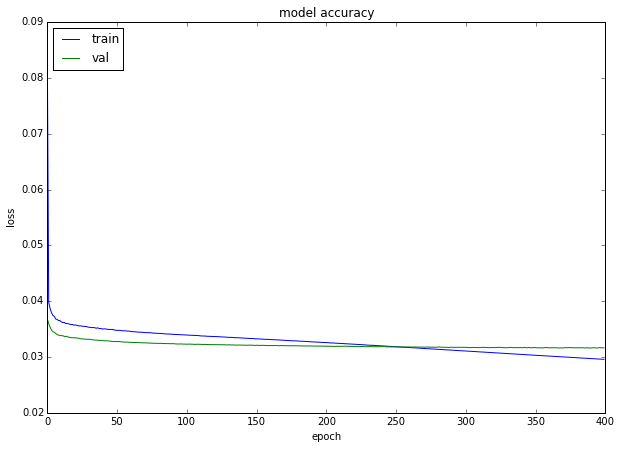

In [383]:
print x_train_a.shape
print x_train_val_a.shape

plt.plot(hist.history['loss'])
plt.plot(hist.history['val_loss'])
plt.title('model accuracy')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

In [94]:
# check that the distance matrix agrees with the one we computed before:
difference = np.linalg.norm(x_train_val_a - decoded_imgs, ord='fro')
print 'Difference was: %f' % (difference, )
if difference < 0.001:
    print 'Good! The distance matrices are the same'
else:
    print 'Uh-oh! The distance matrices are different'

Difference was: 326.582573
Uh-oh! The distance matrices are different


In [207]:
# Getting the reconstruction error for toxins and context genes
training_compression = encoder.predict(x_train)
training_reconstruction = decoder.predict(training_compression)
print x_train.shape
print training_reconstruction.shape
print y_train.shape
y_s = np.reshape(y_train, [y_train.shape[0], ])
print y_s.shape
print y_s
# subtract, then sum, then square, then get square root
training_reconstruction_error = np.sqrt(np.square(np.sum(x_train - training_reconstruction, axis = 1)))
print training_reconstruction_error.shape
print np.mean(training_reconstruction_error[y_s == 0]) #toxin
print np.mean(training_reconstruction_error[y_s == 1]) #context gene
#print np.mean(training_reconstruction_error[y_s == 2])

(1178, 8000)
(1178, 8000)
(1178, 1)
(1178,)
[ 1.  1.  0. ...,  1.  1.  1.]
(1178,)
33.2362050105
140.323042542


In [249]:
a = np.array([[1, 2, 3],
              [4,5,6],
              [7,8,9],
             [10, 11, 12]])
a_ = np.array([0, 1, 0, 1])
print np.mean(np.mean(a[a_ == 0]))
print a.shape
print a_.shape

5.0
(4, 3)
(4,)


In [183]:
a = np.array([[1, 2, 3],
              [4,5,6],
              [7,8,9]])
b = np.array([[2,3,4],
             [6,7,8],
             [10,11,12]])
c = np.sqrt(np.square(np.sum(a-b, axis = 1)))
print (np.sqrt(np.square(np.sum(a-b, axis = 1))))
d = np.array([0, 1, 1])
print np.mean(c[d == 1])

[ 3.  6.  9.]
7.5


In [386]:
#print decoded_imgs[0, 100:200]
from scipy.stats import threshold

row_num = 30
print x_train_val_a[row_num, :].shape
print decoded_imgs.shape
print "number of indices where x_train_a has non-zero value"
print np.where(x_train_val_a[row_num, :] != 0)[0].shape # indices where x_test has non-zero value
print "number of indices where decoded_imgs has non-zero value"
print np.where(decoded_imgs[row_num, :] != 0)[0].shape # indices where decoded_imgs has non-zero value
print x_train_val_a[row_num, np.where(x_train_val_a[row_num, :] != 0)[0]] 
print "number of indices where x_train_a is non-zero but decoded is zero"
print np.where((decoded_imgs[row_num, np.where(x_train_val_a[row_num, :] != 0)[0]]) == 0)[0].shape
print "Zeros in decoded"
print (decoded_imgs[row_num, np.where(x_train_val_a[row_num, :] == 0)[0]])

rows_d = (decoded_imgs != 0).sum(1)
print rows_d[row_num]
thresholded = threshold(decoded_imgs, 0.09)
rows = (thresholded != 0.0).sum(1)

print rows[row_num]
# temp_decod = decoded_imgs
# array_np = np.asarray(temp_decod)
# low_values_indices = array_np <= 0.1  # Where values are low
# array_np[low_values_indices] = 0
# high_values_indices = array_np > 0.1
# array_np[high_values_indices] = 1
# print array_np.shape
# print array_np[row_num, :][0:100]
# print np.where(array_np[row_num, :] != 0)[0].shape
print "should be Not zeros in thresholded"
print (thresholded[row_num, np.where(x_train_val_a[row_num, :] != 0)[0]])
print "should be Not zeros in decoded"
print (decoded_imgs[row_num, np.where(x_train_val_a[row_num, :] != 0)[0]])
#print decoded_imgs[7, 44]

(8000,)
(389, 8000)
number of indices where x_train_a has non-zero value
(165,)
number of indices where decoded_imgs has non-zero value
(8000,)
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  2.  1.  1.  1.  1.  1.
  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.  1.  2.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]
number of indices where x_train_a is non-zero but decoded is zero
(0,)
Zeros in decoded
[ 0.04439553  0.01750007  0.01659757 ...,  0.02224679  0.00599289
  0.00891351]
8000
194
should b

(1178, 8000)
[t-SNE] Computing pairwise distances...
[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Computed conditional probabilities for sample 1000 / 1178
[t-SNE] Computed conditional probabilities for sample 1178 / 1178
[t-SNE] Mean sigma: 0.490174
[t-SNE] Iteration 25: error = 1.1892999, gradient norm = 0.0050451
[t-SNE] Iteration 50: error = 1.0998172, gradient norm = 0.0059355
[t-SNE] Iteration 75: error = 0.8583640, gradient norm = 0.0017017
[t-SNE] Iteration 100: error = 0.8349448, gradient norm = 0.0035702
[t-SNE] KL divergence after 100 iterations with early exaggeration: 0.834945
[t-SNE] Iteration 125: error = 0.7927218, gradient norm = 0.0006369
[t-SNE] Iteration 125: gradient norm 0.000637. Finished.
[t-SNE] Error after 125 iterations: 0.834945


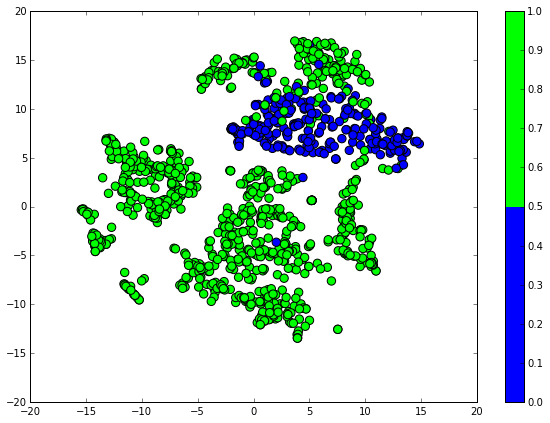

In [462]:
print x_train.shape
X_reduced_a = TruncatedSVD(n_components=10, random_state=0).fit_transform(x_train)
X_embedded_a = TSNE(n_components=2, perplexity=40, verbose=2).fit_transform(X_reduced_a)

#X_embedded = TSNE(n_components=2, perplexity=40, verbose=2).fit_transform(encoded_imgs)
vis_x_a = X_embedded_a[:, 0]
vis_y_a = X_embedded_a[:, 1]

plt.scatter(vis_x_a, vis_y_a, c=y_train, cmap = plt.cm.get_cmap("brg", 2), s = 70)
#plt.scatter(encoded_imgs[:, 0], encoded_imgs[:, 1], c=y_train_val_a, cmap = plt.cm.get_cmap("brg", 3), s = 70)
#plt.scatter(vis_x, vis_y, s = 70)
plt.colorbar()
plt.show()

In [300]:
np.savetxt("training.csv", x_train, delimiter=",")
np.savetxt("test.csv", x_test, delimiter=",")

In [178]:
build_tri_grams('NC_009505_gene_block_prot.fa', 'NC_009505_gene_block_prot_trigrams')
temp_grams = pd.read_csv("NC_009505_gene_block_prot_trigrams", names=sorted(all_tri_grams))
temp_grams_array = temp_grams.values
print temp_grams_array.shape

(384, 8000)


In [125]:
from sklearn.utils.testing import (assert_array_almost_equal, assert_equal,
                                   assert_raises)

tsvd = TruncatedSVD(n_components = 1024, random_state=0)
x_train_reduced = tsvd.fit_transform(x_train)
print x_train_reduced
x_train_reduced_back = tsvd.inverse_transform(x_train_reduced)
print x_train_reduced_back
print x_train_reduced_back.shape

assert_array_almost_equal(x_train, x_train_reduced_back, decimal=3)

[[  4.29179563e+00   2.34714640e+00   1.90594375e+00 ...,   2.23726675e-02
    1.47070019e-02  -3.40344215e-02]
 [  4.86107922e+00   1.65556153e-01  -3.76140262e+00 ...,   2.16821300e-02
    1.33571885e-02  -2.61333608e-02]
 [  1.96224178e+00   1.05412672e+00  -5.65619008e-01 ...,  -9.43652661e-02
   -1.87879182e-01  -1.52775718e-02]
 ..., 
 [  7.14395792e+00  -1.43588918e+00  -4.21086846e+00 ...,  -2.18242587e-02
    1.74171598e-03   2.92074773e-02]
 [  3.45891461e+00  -1.53560526e+00   1.02759020e+00 ...,  -1.51399313e-02
   -1.32352879e-01   2.46811134e-02]
 [  8.23929847e+00   4.81987484e+00   3.05761661e+00 ...,  -4.59057075e-04
    2.63830484e-02  -2.68927476e-02]]
[[  3.49080543e-04  -5.13940703e-03   6.22468610e-03 ...,  -5.79375674e-04
    2.72954398e-04   1.51356998e-03]
 [ -4.93409213e-03  -1.81933181e-03  -8.52817875e-03 ...,   1.57886786e-03
    7.09745700e-04  -6.53936031e-03]
 [  3.98761678e-02   6.70869086e-03  -4.28740279e-03 ...,  -1.08557663e-03
    7.47879344e-04  -

AssertionError: 
Arrays are not almost equal to 3 decimals

(mismatch 57.7697368421%)
 x: array([[ 0.,  0.,  0., ...,  0.,  0.,  0.],
       [ 0.,  0.,  0., ...,  0.,  0.,  0.],
       [ 0.,  0.,  0., ...,  0.,  0.,  0.],...
 y: array([[  3.491e-04,  -5.139e-03,   6.225e-03, ...,  -5.794e-04,
          2.730e-04,   1.514e-03],
       [ -4.934e-03,  -1.819e-03,  -8.528e-03, ...,   1.579e-03,...

In [431]:
"""
Building trigrams for all the gene blocks of bacteria
"""

import os
os.chdir('/home/nafizh/ML_works/all_tri_grams')

target_dir = "/home/nafizh/ML_works/all_gene_blocks"
for root, subFolders, files in os.walk(target_dir):
    for file_ in files:
        print file_
        tok = file_.split(".")[0]
        os.chdir('/home/nafizh/ML_works/all_gene_blocks')
        in_handle = open(file_,'r')
        os.chdir('/home/nafizh/ML_works/all_tri_grams')
        build_tri_grams(in_handle, tok + '_trigrams')
        
print "Done"

NC_010079_gene_block_prot.fa
NC_013956_gene_block_prot.fa
NC_012926_gene_block_prot.fa
NC_005957_gene_block_prot.fa
NC_011741_gene_block_prot.fa
NC_014211_gene_block_prot.fa
NC_012695_gene_block_prot.fa
NC_021834_gene_block_prot.fa
NC_022648_gene_block_prot.fa
NC_008086_gene_block_prot.fa
NC_009436_gene_block_prot.fa
NC_000915_gene_block_prot.fa
NC_011978_gene_block_prot.fa
NC_022244_gene_block_prot.fa
NC_014926_gene_block_prot.fa
NC_009664_gene_block_prot.fa
NC_011595_gene_block_prot.fa
NC_022664_gene_block_prot.fa
NC_013720_gene_block_prot.fa
NC_007509_gene_block_prot.fa
NC_018223_gene_block_prot.fa
NC_020542_gene_block_prot.fa
NC_016617_gene_block_prot.fa
NC_015978_gene_block_prot.fa
NC_013732_gene_block_prot.fa
NC_012026_gene_block_prot.fa
NC_019845_gene_block_prot.fa
NC_021591_gene_block_prot.fa
NC_000921_gene_block_prot.fa
NC_016111_gene_block_prot.fa
NC_009881_gene_block_prot.fa
NC_014011_gene_block_prot.fa
NC_018027_gene_block_prot.fa
NC_011047_gene_block_prot.fa
NC_018643_gene

In [26]:
"""
Using the whole toxin and context gene data set as training set
"""

real_training_compressed = np.vstack((x_train_whole_compressed, x_true_test_compressed))
print real_training_compressed.shape
real_training_label = np.vstack((y_train, y_test))
print real_training_label.shape

(1683, 256)
(1683, 1)


## Applying Logistic Regression to real bacteria data

In [452]:
classifier = None
classifier = LogisticRegression()
classifier.fit(real_training_compressed, real_training_label)

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='ovr', n_jobs=1,
          penalty='l2', random_state=None, solver='liblinear', tol=0.0001,
          verbose=0, warm_start=False)

In [477]:
"""
Making predictions for toxins and writing them in files for real bacteria data
"""

os.chdir('/home/nafizh/ML_works/all_tri_grams')

target_dir = "/home/nafizh/ML_works/all_tri_grams"

for root, subFolders, files in os.walk(target_dir):
    #print root, subFolders
    for file_ in files:
        #print file_
        os.chdir('/home/nafizh/ML_works/all_tri_grams')
        toks = file_.split("_")
        file_name = "_".join(toks[0:-1]) + ".fa"
        print file_name
        real_life_data = pd.read_csv(file_, names = sorted(all_tri_grams))

        # taking the values from panda into numpy array
        real_life_data_array = real_life_data.values
        #print real_life_data_array.shape
        real_life_data_compressed = encoder.predict(real_life_data_array, batch_size = 100)
        #print x_train_whole_compressed.shape
        
        # predicting toxins
        scores = classifier.predict(real_life_data_compressed)
        scores_prob = classifier.predict_proba(real_life_data_compressed)
        put_tox_index_list = np.array(list(np.where(scores == 0)[0])).tolist()
        
        tox_greater_nine = []
        for i in put_tox_index_list:
            if scores_prob[i][0] >= 0.9:
                tox_greater_nine.append(i)
                
        os.chdir('/home/nafizh/ML_works/all_gene_blocks')
        with open(file_name, 'r') as in_handle:
            os.chdir('/home/nafizh/ML_works/all_tox_predictions_0.9')
            out_handle = open("_".join(toks[0:-1]) + "_predictions.fa", "w")
            for index, record in enumerate(SeqIO.parse(in_handle, 'fasta')):
                if index in tox_greater_nine:
                    out_handle.write(">%s\n%s\n" % (record.description, record.seq))
                #print scores.shape
        #break
print "Done"

NC_008229_gene_block_prot.fa
NC_017059_gene_block_prot.fa
NC_018593_gene_block_prot.fa
NC_019815_gene_block_prot.fa
NC_006300_gene_block_prot.fa
NC_007643_gene_block_prot.fa
NC_014920_gene_block_prot.fa
NC_019954_gene_block_prot.fa
NC_017278_gene_block_prot.fa
NC_017279_gene_block_prot.fa
NC_018139_gene_block_prot.fa
NC_007951_gene_block_prot.fa
NC_022786_gene_block_prot.fa
NC_017588_gene_block_prot.fa
NC_023037_gene_block_prot.fa
NC_022594_gene_block_prot.fa
NC_010376_gene_block_prot.fa
NC_009655_gene_block_prot.fa
NC_021024_gene_block_prot.fa
NC_007645_gene_block_prot.fa
NC_017251_gene_block_prot.fa
NC_002488_gene_block_prot.fa
NC_019962_gene_block_prot.fa
NC_017642_gene_block_prot.fa
NC_013198_gene_block_prot.fa
NC_013235_gene_block_prot.fa
NC_022351_gene_block_prot.fa
NC_019849_gene_block_prot.fa
NC_018877_gene_block_prot.fa
NC_021016_gene_block_prot.fa
NC_019763_gene_block_prot.fa
NC_023032_gene_block_prot.fa
NC_018631_gene_block_prot.fa
NC_009495_gene_block_prot.fa
NC_006270_gene

In [478]:
"""
Making predictions for toxins and writing them in files for real bacteria data
"""

os.chdir('/home/nafizh/ML_works/all_tri_grams')

target_dir = "/home/nafizh/ML_works/all_tri_grams"

for root, subFolders, files in os.walk(target_dir):
    #print root, subFolders
    for file_ in files:
        #print file_
        os.chdir('/home/nafizh/ML_works/all_tri_grams')
        toks = file_.split("_")
        file_name = "_".join(toks[0:-1]) + ".fa"
        print file_name
        real_life_data = pd.read_csv(file_, names = sorted(all_tri_grams))

        # taking the values from panda into numpy array
        real_life_data_array = real_life_data.values
        #print real_life_data_array.shape
        real_life_data_compressed = encoder.predict(real_life_data_array, batch_size = 100)
        #print x_train_whole_compressed.shape
        
        # predicting toxins
        scores = classifier.predict(real_life_data_compressed)
        scores_prob = classifier.predict_proba(real_life_data_compressed)
        put_tox_index_list = np.array(list(np.where(scores == 0)[0])).tolist()
        
        tox_greater_nine = []
        for i in put_tox_index_list:
            if scores_prob[i][0] >= 0.99:
                tox_greater_nine.append(i)
                
        os.chdir('/home/nafizh/ML_works/all_gene_blocks')
        with open(file_name, 'r') as in_handle:
            os.chdir('/home/nafizh/ML_works/all_tox_predictions_0.99')
            out_handle = open("_".join(toks[0:-1]) + "_predictions.fa", "w")
            for index, record in enumerate(SeqIO.parse(in_handle, 'fasta')):
                if index in tox_greater_nine:
                    out_handle.write(">%s\n%s\n" % (record.description, record.seq))
                #print scores.shape
        #break
print "Done"

NC_008229_gene_block_prot.fa
NC_017059_gene_block_prot.fa
NC_018593_gene_block_prot.fa
NC_019815_gene_block_prot.fa
NC_006300_gene_block_prot.fa
NC_007643_gene_block_prot.fa
NC_014920_gene_block_prot.fa
NC_019954_gene_block_prot.fa
NC_017278_gene_block_prot.fa
NC_017279_gene_block_prot.fa
NC_018139_gene_block_prot.fa
NC_007951_gene_block_prot.fa
NC_022786_gene_block_prot.fa
NC_017588_gene_block_prot.fa
NC_023037_gene_block_prot.fa
NC_022594_gene_block_prot.fa
NC_010376_gene_block_prot.fa
NC_009655_gene_block_prot.fa
NC_021024_gene_block_prot.fa
NC_007645_gene_block_prot.fa
NC_017251_gene_block_prot.fa
NC_002488_gene_block_prot.fa
NC_019962_gene_block_prot.fa
NC_017642_gene_block_prot.fa
NC_013198_gene_block_prot.fa
NC_013235_gene_block_prot.fa
NC_022351_gene_block_prot.fa
NC_019849_gene_block_prot.fa
NC_018877_gene_block_prot.fa
NC_021016_gene_block_prot.fa
NC_019763_gene_block_prot.fa
NC_023032_gene_block_prot.fa
NC_018631_gene_block_prot.fa
NC_009495_gene_block_prot.fa
NC_006270_gene

In [480]:
"""
Writing down all 0.99 sequences into one single fasta file
"""

os.chdir('/home/nafizh/ML_works/')
out_handle = open('all_0.99_sequences.fa', 'w')

target_dir = '/home/nafizh/ML_works/all_tox_predictions_0.99'

for root, subFolders, files in os.walk(target_dir):
    #print root, subFolders
    for file_ in files:
        print file_
        os.chdir('/home/nafizh/ML_works/all_tox_predictions_0.99')
        with open(file_, 'r') as in_handle:
            os.chdir('/home/nafizh/ML_works/')
            for index, record in enumerate(SeqIO.parse(in_handle, 'fasta')):
                out_handle.write(">%s\n%s\n" % (record.description, record.seq))
                
                
out_handle.close()
print "Done"

NC_017588_gene_block_prot_predictions.fa
NC_005296_gene_block_prot_predictions.fa
NC_014479_gene_block_prot_predictions.fa
NC_019903_gene_block_prot_predictions.fa
NC_017272_gene_block_prot_predictions.fa
NC_018586_gene_block_prot_predictions.fa
NC_007712_gene_block_prot_predictions.fa
NC_015554_gene_block_prot_predictions.fa
NC_014758_gene_block_prot_predictions.fa
NC_022238_gene_block_prot_predictions.fa
NC_018645_gene_block_prot_predictions.fa
NC_011205_gene_block_prot_predictions.fa
NC_015873_gene_block_prot_predictions.fa
NC_021825_gene_block_prot_predictions.fa
NC_008570_gene_block_prot_predictions.fa
NC_010681_gene_block_prot_predictions.fa
NC_010163_gene_block_prot_predictions.fa
NC_022439_gene_block_prot_predictions.fa
NC_009504_gene_block_prot_predictions.fa
NC_019896_gene_block_prot_predictions.fa
NC_015278_gene_block_prot_predictions.fa
NC_008703_gene_block_prot_predictions.fa
NC_017523_gene_block_prot_predictions.fa
NC_022579_gene_block_prot_predictions.fa
NC_007576_gene_b

In [481]:
"""
Removing all the notranslation sequences from the all 0.99 fasta file and
writing this to another file
"""

os.chdir('/home/nafizh/ML_works/')
out_handle = open('all_0.99_sequences_proper.fa', 'w')

with open('all_0.99_sequences.fa', 'r') as in_handle:
    for index, record in enumerate(SeqIO.parse(in_handle, 'fasta')):
        if record.seq == 'notranslation':
            continue
        out_handle.write(">%s\n%s\n" % (record.description, record.seq))
        
out_handle.close()
print "Done"

Done


In [485]:
count = 0
with open('100_random_0.99_seqs.fa', 'r') as in_handle:
    for index, record in enumerate(SeqIO.parse(in_handle, 'fasta')):
        if record.description.split("|")[1] == "product:_hypothetical protein":
            count = count + 1

print count

58


In [484]:
"""
Getting random 100 sequences from the 0.99 probability tox sequences
and writing it into 100_random_0.99_seqs.fa file
"""
import random
random.seed(0)
hundred_numbers = random.sample(range(0, 292), 100)
print hundred_numbers
out_handle = open('100_random_0.99_seqs.fa', "w")
with open('all_0.99_sequences_proper.fa', 'r') as in_handle:
    for index, record in enumerate(SeqIO.parse(in_handle, 'fasta')):
        if index in hundred_numbers:
            out_handle.write(">%s\n%s\n" % (record.description, record.seq))
            
out_handle.close()
print "Done"

[246, 220, 121, 74, 147, 116, 224, 86, 135, 165, 256, 141, 78, 210, 171, 69, 251, 270, 221, 291, 84, 197, 242, 183, 126, 26, 115, 161, 241, 254, 124, 225, 67, 208, 280, 3, 184, 101, 209, 169, 0, 123, 216, 60, 80, 215, 47, 139, 58, 235, 194, 107, 19, 76, 120, 273, 25, 129, 282, 127, 188, 261, 236, 138, 133, 262, 134, 284, 128, 64, 42, 41, 260, 143, 103, 239, 163, 231, 274, 179, 190, 263, 113, 81, 146, 57, 167, 174, 182, 119, 191, 286, 90, 131, 213, 180, 155, 16, 118, 93]
Done


In [512]:
# Creating a pandas data frame for predicted bacteria sequences function report
col_1_names = range(1, 101)
df = pd.DataFrame(np.nan, index = col_1_names, columns = ['Sequence Number', 'Annotated Function of Top hits against bacteria db'])
print df

     Sequence Number  Annotated Function of Top hits against bacteria db
1                NaN                                                NaN 
2                NaN                                                NaN 
3                NaN                                                NaN 
4                NaN                                                NaN 
5                NaN                                                NaN 
6                NaN                                                NaN 
7                NaN                                                NaN 
8                NaN                                                NaN 
9                NaN                                                NaN 
10               NaN                                                NaN 
11               NaN                                                NaN 
12               NaN                                                NaN 
13               NaN                               

In [517]:
print df.iloc[0, 1]

nan


In [531]:
"""
Populating the data frame with top 10 hits for each predicted bacteriocin sequences
"""

os.chdir('/home/nafizh/ML_works/analysis_ml_bacteria')
from Bio.Blast import NCBIXML
from collections import defaultdict

result_handle = open("blast_result_0.99_random_100.xml", 'r')

blast_records = NCBIXML.parse(result_handle)

#bac_genome_protein_dic = defaultdict(list)
for i, blast_record in enumerate(blast_records):
    #bacteriocin_id = blast_record.query.split("|")[0]
    #original_protein_function = blast_record.query.split("|")[-1]
    function_info_str = ''
    print i
    #print bacteriocin_id
    #print original_protein_function
    for j, alignment in enumerate(blast_record.alignments): # alignment = Hit_num in blast result
        #print alignment.title
        #print
        #print alignment.title
            #break
        toks = alignment.title.split(' ')[2:]
        #print toks
        function_info = ' '.join(toks)
        function_info_str = function_info_str + '%d. %s\n' % (j+1, function_info)
        flag = 1
        #print function_info
        if j == 9:
            df.iloc[i, 0] = i + 1
            df.iloc[i, 1] = function_info_str
            #print function_info_str
            flag = 0
            break
    if flag == 1: # Sometimes we do not have enough hits
        df.iloc[i, 0] = i + 1
        df.iloc[i, 1] = function_info_str
        #print function_info_str
        flag = 1
        
    #if i == 4:
        #break

print "Done"

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
Done


In [532]:
df.to_excel('Predicted_sequence_functions.xlsx', sheet_name='Predicted_sequence_functions')

In [463]:
print np.where(scores == 0)
print scores_prob[96]
print scores_prob[108]
print scores_prob[110]
print scores_prob[112]
print scores_prob[126]
print scores_prob[168]
print scores_prob[188]
print scores_prob[189]
print scores_prob[252]

(array([ 96, 108, 110, 112, 126, 168, 188, 189, 252]),)
[ 0.73357387  0.26642613]
[ 0.84503168  0.15496832]
[ 0.9395541  0.0604459]
[ 0.73927465  0.26072535]
[ 0.85722228  0.14277772]
[ 0.65261257  0.34738743]
[ 0.93383071  0.06616929]
[ 0.85385456  0.14614544]
[ 0.78539523  0.21460477]


In [467]:
os.chdir('/home/nafizh/ML_works/all_tri_grams')
real_life_data = pd.read_csv('NC_002179_gene_block_prot_trigrams', names = sorted(all_tri_grams))

# taking the values from panda into numpy array
real_life_data_array = real_life_data.values
#print real_life_data_array.shape
real_life_data_compressed = encoder.predict(real_life_data_array, batch_size = 100)
#print x_train_whole_compressed.shape

# predicting toxins
scores = classifier.predict(real_life_data_compressed)
scores_prob = classifier.predict_proba(real_life_data_compressed)
print scores_prob[scores == 0]

[[ 0.59208166  0.40791834]
 [ 0.536546    0.463454  ]]


In [468]:
print put_tox_index_list

[7, 61, 97, 102, 107, 108, 118, 124, 149, 151, 156, 162, 203, 215, 245, 278, 334, 365, 372, 385, 390, 401, 410, 412, 437, 447, 468, 484, 505, 530, 539, 540, 541, 569, 589, 595, 614, 643, 692, 695, 721, 740, 756, 798, 833, 846]


# Applying SVM to real bacteria data

In [437]:
svm_classifier = None
svm_classifier = SVC(gamma = 0.1, C = 1.0, kernel = 'rbf', random_state=1)
svm_classifier.fit(real_training_compressed, real_training_label)

SVC(C=1.0, cache_size=200, class_weight=None, coef0=0.0,
  decision_function_shape=None, degree=3, gamma=0.1, kernel='rbf',
  max_iter=-1, probability=False, random_state=1, shrinking=True,
  tol=0.001, verbose=False)

In [124]:
"""
Making predictions for toxins and writing them in files for real bacteria data
for probaility >= 0.99999
"""

os.chdir('/home/nafizh/ML_works/all_tri_grams')

target_dir = "/home/nafizh/ML_works/all_tri_grams"

for root, subFolders, files in os.walk(target_dir):
    #print root, subFolders
    for file_ in files:
        #print file_
        os.chdir('/home/nafizh/ML_works/all_tri_grams')
        toks = file_.split("_")
        file_name = "_".join(toks[0:-1]) + ".fa"
        print file_name
        real_life_data = pd.read_csv(file_, names = sorted(all_tri_grams))

        # taking the values from panda into numpy array
        real_life_data_array = real_life_data.values
        #print real_life_data_array.shape
        real_life_data_compressed = encoder.predict(real_life_data_array, batch_size = 100)
        #print x_train_whole_compressed.shape
        
        # predicting toxins
        scores = svm_classifier.predict(real_life_data_compressed)
        scores_prob = svm_classifier.predict_proba(real_life_data_compressed)
        put_tox_index_list = np.array(list(np.where(scores == 0)[0])).tolist()
        
        tox_greater_nine = []
        for i in put_tox_index_list:
            if scores_prob[i][0] >= 0.99999:
                tox_greater_nine.append(i)
                
        os.chdir('/home/nafizh/ML_works/all_gene_blocks')
        with open(file_name, 'r') as in_handle:
            os.chdir('/home/nafizh/ML_works/all_svm_tox_predictions_0.99999')
            out_handle = open("_".join(toks[0:-1]) + "_predictions.fa", "w")
            for index, record in enumerate(SeqIO.parse(in_handle, 'fasta')):
                if index in tox_greater_nine:
                    out_handle.write(">%s|%f\n%s\n" % (record.description, scores_prob[index][0], record.seq))
                #print scores.shape
        #break
        out_handle.close()
print "Done"

NC_008229_gene_block_prot.fa
NC_017059_gene_block_prot.fa
NC_018593_gene_block_prot.fa
NC_019815_gene_block_prot.fa
NC_006300_gene_block_prot.fa
NC_007643_gene_block_prot.fa
NC_014920_gene_block_prot.fa
NC_019954_gene_block_prot.fa
NC_017278_gene_block_prot.fa
NC_017279_gene_block_prot.fa
NC_018139_gene_block_prot.fa
NC_007951_gene_block_prot.fa
NC_022786_gene_block_prot.fa
NC_017588_gene_block_prot.fa
NC_023037_gene_block_prot.fa
NC_022594_gene_block_prot.fa
NC_010376_gene_block_prot.fa
NC_009655_gene_block_prot.fa
NC_021024_gene_block_prot.fa
NC_007645_gene_block_prot.fa
NC_017251_gene_block_prot.fa
NC_002488_gene_block_prot.fa
NC_019962_gene_block_prot.fa
NC_017642_gene_block_prot.fa
NC_013198_gene_block_prot.fa
NC_013235_gene_block_prot.fa
NC_022351_gene_block_prot.fa
NC_019849_gene_block_prot.fa
NC_018877_gene_block_prot.fa
NC_021016_gene_block_prot.fa
NC_019763_gene_block_prot.fa
NC_023032_gene_block_prot.fa
NC_018631_gene_block_prot.fa
NC_009495_gene_block_prot.fa
NC_006270_gene

In [126]:
"""
Making predictions for toxins and writing them in files for real bacteria data
for probaility >= 0.999
"""

os.chdir('/home/nafizh/ML_works/all_tri_grams')

target_dir = "/home/nafizh/ML_works/all_tri_grams"

for root, subFolders, files in os.walk(target_dir):
    #print root, subFolders
    for file_ in files:
        #print file_
        os.chdir('/home/nafizh/ML_works/all_tri_grams')
        toks = file_.split("_")
        file_name = "_".join(toks[0:-1]) + ".fa"
        print file_name
        real_life_data = pd.read_csv(file_, names = sorted(all_tri_grams))

        # taking the values from panda into numpy array
        real_life_data_array = real_life_data.values
        #print real_life_data_array.shape
        real_life_data_compressed = encoder.predict(real_life_data_array, batch_size = 100)
        #print x_train_whole_compressed.shape
        
        # predicting toxins
        scores = svm_classifier.predict(real_life_data_compressed)
        scores_prob = svm_classifier.predict_proba(real_life_data_compressed)
        put_tox_index_list = np.array(list(np.where(scores == 0)[0])).tolist()
        
        tox_greater_nine = []
        for i in put_tox_index_list:
            if scores_prob[i][0] >= 0.999:
                tox_greater_nine.append(i)
                
        os.chdir('/home/nafizh/ML_works/all_gene_blocks')
        with open(file_name, 'r') as in_handle:
            os.chdir('/home/nafizh/ML_works/all_svm_tox_predictions_0.999')
            out_handle = open("_".join(toks[0:-1]) + "_predictions.fa", "w")
            for index, record in enumerate(SeqIO.parse(in_handle, 'fasta')):
                if index in tox_greater_nine:
                    out_handle.write(">%s|%f\n%s\n" % (record.description, scores_prob[index][0], record.seq))
                #print scores.shape
        #break
        out_handle.close()
print "Done"

NC_008229_gene_block_prot.fa
NC_017059_gene_block_prot.fa
NC_018593_gene_block_prot.fa
NC_019815_gene_block_prot.fa
NC_006300_gene_block_prot.fa
NC_007643_gene_block_prot.fa
NC_014920_gene_block_prot.fa
NC_019954_gene_block_prot.fa
NC_017278_gene_block_prot.fa
NC_017279_gene_block_prot.fa
NC_018139_gene_block_prot.fa
NC_007951_gene_block_prot.fa
NC_022786_gene_block_prot.fa
NC_017588_gene_block_prot.fa
NC_023037_gene_block_prot.fa
NC_022594_gene_block_prot.fa
NC_010376_gene_block_prot.fa
NC_009655_gene_block_prot.fa
NC_021024_gene_block_prot.fa
NC_007645_gene_block_prot.fa
NC_017251_gene_block_prot.fa
NC_002488_gene_block_prot.fa
NC_019962_gene_block_prot.fa
NC_017642_gene_block_prot.fa
NC_013198_gene_block_prot.fa
NC_013235_gene_block_prot.fa
NC_022351_gene_block_prot.fa
NC_019849_gene_block_prot.fa
NC_018877_gene_block_prot.fa
NC_021016_gene_block_prot.fa
NC_019763_gene_block_prot.fa
NC_023032_gene_block_prot.fa
NC_018631_gene_block_prot.fa
NC_009495_gene_block_prot.fa
NC_006270_gene

In [576]:
"""
Making predictions for toxins and writing them in files for real bacteria data
for probaility >= 0.9
"""

os.chdir('/home/nafizh/ML_works/all_tri_grams')

target_dir = "/home/nafizh/ML_works/all_tri_grams"

for root, subFolders, files in os.walk(target_dir):
    #print root, subFolders
    for file_ in files:
        #print file_
        os.chdir('/home/nafizh/ML_works/all_tri_grams')
        toks = file_.split("_")
        file_name = "_".join(toks[0:-1]) + ".fa"
        print file_name
        real_life_data = pd.read_csv(file_, names = sorted(all_tri_grams))

        # taking the values from panda into numpy array
        real_life_data_array = real_life_data.values
        #print real_life_data_array.shape
        real_life_data_compressed = encoder.predict(real_life_data_array, batch_size = 100)
        #print x_train_whole_compressed.shape
        
        # predicting toxins
        scores = svm_classifier.predict(real_life_data_compressed)
        scores_prob = svm_classifier.predict_proba(real_life_data_compressed)
        put_tox_index_list = np.array(list(np.where(scores == 0)[0])).tolist()
        
        tox_greater_nine = []
        for i in put_tox_index_list:
            if scores_prob[i][0] >= 0.9:
                tox_greater_nine.append(i)
                
        os.chdir('/home/nafizh/ML_works/all_gene_blocks')
        with open(file_name, 'r') as in_handle:
            os.chdir('/home/nafizh/ML_works/all_svm_tox_predictions_0.9')
            out_handle = open("_".join(toks[0:-1]) + "_predictions.fa", "w")
            for index, record in enumerate(SeqIO.parse(in_handle, 'fasta')):
                if index in tox_greater_nine:
                    out_handle.write(">%s\n%s\n" % (record.description, record.seq))
                #print scores.shape
        #break
        out_handle.close()
print "Done"

NC_008229_gene_block_prot.fa
NC_017059_gene_block_prot.fa
NC_018593_gene_block_prot.fa
NC_019815_gene_block_prot.fa
NC_006300_gene_block_prot.fa
NC_007643_gene_block_prot.fa
NC_014920_gene_block_prot.fa
NC_019954_gene_block_prot.fa
NC_017278_gene_block_prot.fa
NC_017279_gene_block_prot.fa
NC_018139_gene_block_prot.fa
NC_007951_gene_block_prot.fa
NC_022786_gene_block_prot.fa
NC_017588_gene_block_prot.fa
NC_023037_gene_block_prot.fa
NC_022594_gene_block_prot.fa
NC_010376_gene_block_prot.fa
NC_009655_gene_block_prot.fa
NC_021024_gene_block_prot.fa
NC_007645_gene_block_prot.fa
NC_017251_gene_block_prot.fa
NC_002488_gene_block_prot.fa
NC_019962_gene_block_prot.fa
NC_017642_gene_block_prot.fa
NC_013198_gene_block_prot.fa
NC_013235_gene_block_prot.fa
NC_022351_gene_block_prot.fa
NC_019849_gene_block_prot.fa
NC_018877_gene_block_prot.fa
NC_021016_gene_block_prot.fa
NC_019763_gene_block_prot.fa
NC_023032_gene_block_prot.fa
NC_018631_gene_block_prot.fa
NC_009495_gene_block_prot.fa
NC_006270_gene

In [577]:
"""
Writing down all 0.99 sequences into one single fasta file
"""

os.chdir('/home/nafizh/ML_works/')
out_handle = open('all_svm_0.99_sequences.fa', 'w')

target_dir = '/home/nafizh/ML_works/all_svm_tox_predictions_0.99'

for root, subFolders, files in os.walk(target_dir):
    #print root, subFolders
    for file_ in files:
        print file_
        os.chdir('/home/nafizh/ML_works/all_svm_tox_predictions_0.99')
        with open(file_, 'r') as in_handle:
            os.chdir('/home/nafizh/ML_works/')
            for index, record in enumerate(SeqIO.parse(in_handle, 'fasta')):
                out_handle.write(">%s\n%s\n" % (record.description, record.seq))
                
                
out_handle.close()
print "Done"

NC_017588_gene_block_prot_predictions.fa
NC_005296_gene_block_prot_predictions.fa
NC_014479_gene_block_prot_predictions.fa
NC_019903_gene_block_prot_predictions.fa
NC_017272_gene_block_prot_predictions.fa
NC_018586_gene_block_prot_predictions.fa
NC_007712_gene_block_prot_predictions.fa
NC_015554_gene_block_prot_predictions.fa
NC_014758_gene_block_prot_predictions.fa
NC_022238_gene_block_prot_predictions.fa
NC_018645_gene_block_prot_predictions.fa
NC_011205_gene_block_prot_predictions.fa
NC_015873_gene_block_prot_predictions.fa
NC_021825_gene_block_prot_predictions.fa
NC_008570_gene_block_prot_predictions.fa
NC_010681_gene_block_prot_predictions.fa
NC_010163_gene_block_prot_predictions.fa
NC_022439_gene_block_prot_predictions.fa
NC_009504_gene_block_prot_predictions.fa
NC_019896_gene_block_prot_predictions.fa
NC_015278_gene_block_prot_predictions.fa
NC_008703_gene_block_prot_predictions.fa
NC_017523_gene_block_prot_predictions.fa
NC_022579_gene_block_prot_predictions.fa
NC_007576_gene_b

In [578]:
"""
Getting random 100 sequences from the 0.99 probability svm tox sequences
and writing it into svm_100_random_0.99_seqs.fa file
"""
import random
random.seed(0)
hundred_numbers = random.sample(range(0, 1010), 100)
print hundred_numbers
out_handle = open('svm_100_random_0.99_seqs.fa', "w")
with open('all_svm_0.99_sequences.fa', 'r') as in_handle:
    for index, record in enumerate(SeqIO.parse(in_handle, 'fasta')):
        if index in hundred_numbers:
            out_handle.write(">%s\n%s\n" % (record.description, record.seq))
            
out_handle.close()
print "Done"

[852, 764, 423, 260, 514, 406, 786, 304, 477, 583, 908, 504, 281, 753, 615, 249, 904, 975, 803, 894, 307, 721, 888, 675, 465, 99, 427, 600, 896, 948, 467, 847, 254, 1003, 535, 13, 700, 388, 801, 648, 1, 478, 839, 235, 314, 840, 184, 546, 229, 929, 771, 429, 77, 306, 485, 890, 104, 525, 672, 520, 773, 512, 913, 571, 555, 420, 562, 362, 542, 273, 178, 175, 574, 995, 446, 83, 707, 818, 860, 784, 835, 857, 501, 942, 653, 977, 749, 930, 825, 543, 873, 532, 413, 605, 912, 967, 725, 75, 558, 443]
Done


In [579]:
# Creating a pandas data frame for predicted bacteria sequences function report
col_1_names = range(1, 101)
df = pd.DataFrame(np.nan, index = col_1_names, columns = ['Sequence Number', 'Annotated Function of Top hits against bacteria db'])
print df

     Sequence Number  Annotated Function of Top hits against bacteria db
1                NaN                                                NaN 
2                NaN                                                NaN 
3                NaN                                                NaN 
4                NaN                                                NaN 
5                NaN                                                NaN 
6                NaN                                                NaN 
7                NaN                                                NaN 
8                NaN                                                NaN 
9                NaN                                                NaN 
10               NaN                                                NaN 
11               NaN                                                NaN 
12               NaN                                                NaN 
13               NaN                               

In [580]:
"""
Populating the data frame with top 10 hits for each predicted bacteriocin sequences
"""

os.chdir('/home/nafizh/ML_works/analysis_svm')
from Bio.Blast import NCBIXML
from collections import defaultdict

result_handle = open("blast_result_0.99_random_100_svm.xml", 'r')

blast_records = NCBIXML.parse(result_handle)

#bac_genome_protein_dic = defaultdict(list)
for i, blast_record in enumerate(blast_records):
    #bacteriocin_id = blast_record.query.split("|")[0]
    #original_protein_function = blast_record.query.split("|")[-1]
    function_info_str = ''
    print i
    #print bacteriocin_id
    #print original_protein_function
    for j, alignment in enumerate(blast_record.alignments): # alignment = Hit_num in blast result
        #print alignment.title
        #print
        #print alignment.title
            #break
        toks = alignment.title.split(' ')[2:]
        #print toks
        function_info = ' '.join(toks)
        function_info_str = function_info_str + '%d. %s\n' % (j+1, function_info)
        flag = 1
        #print function_info
        if j == 9:
            df.iloc[i, 0] = i + 1
            df.iloc[i, 1] = function_info_str
            #print function_info_str
            flag = 0
            break
    if flag == 1: # Sometimes we do not have enough hits
        df.iloc[i, 0] = i + 1
        df.iloc[i, 1] = function_info_str
        #print function_info_str
        flag = 1
        
    #if i == 4:
        #break

print "Done"

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
Done


In [582]:
"""
Writing down the data frame to an excel file
"""
df.to_excel('SVM_predicted_sequence_functions.xlsx', sheet_name='SVM')

In [620]:
print len(y_test[y_test == 1])
print "hello"


388


/home/nafizh/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:49: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
/home/nafizh/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:65: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().


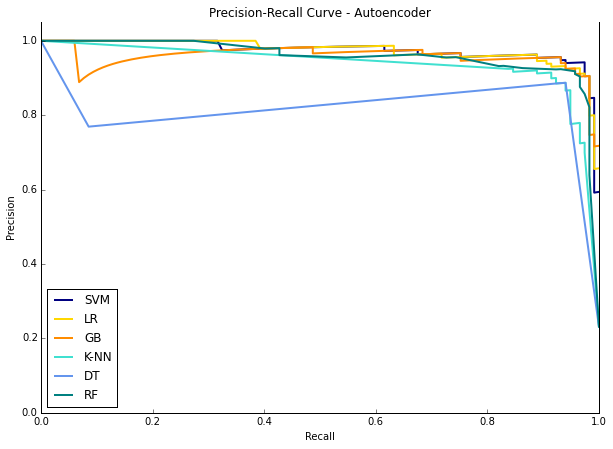

In [461]:
"""
Drawing a precision-recall curve for all the methods
"""

from sklearn.metrics import precision_recall_curve
from sklearn.metrics import average_precision_score

classifier = SVC(gamma = 0.1, C = 1.0, kernel = 'rbf', random_state=1, probability = True)
classifier.fit(x_train_whole_compressed, y_train)
svm_scores = classifier.predict_proba(x_true_test_compressed)
#print(metrics.classification_report(y_test, scores[]))
precision, recall, thresholds = precision_recall_curve(y_test, svm_scores[:, 0], pos_label = 0)
average_precision = average_precision_score(y_test, svm_scores[:, 0])

fig, ax = plt.subplots()
#ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')

#fig.clf()
ax.plot(recall, precision, lw = 2, color='navy',
         label='SVM')
ax.set_xlabel('Recall')
ax.set_ylabel('Precision')
ax.set_ylim([0.0, 1.05])
ax.set_xlim([0.0, 1.0])
ax.set_title('Precision-Recall Curve - Autoencoder')

          
          
classifier = LogisticRegression(C = 0.1, penalty = 'l2', random_state = 1)
classifier.fit(x_train_whole_compressed, y_train)
scores = classifier.predict_proba(x_true_test_compressed)
precision, recall, thresholds = precision_recall_curve(y_test, scores[:, 0], pos_label = 0)
ax.plot(recall, precision, lw = 2, color='gold',
         label='LR')


classifier = xgboost.XGBClassifier(gamma = 0, min_child_weight = 4, max_depth = 3)
classifier.fit(x_train_whole_compressed, y_train)
scores = classifier.predict_proba(x_true_test_compressed)
precision, recall, thresholds = precision_recall_curve(y_test, scores[:, 0], pos_label = 0)
ax.plot(recall, precision, lw = 2, color='darkorange',
         label='GB')


classifier = KNeighborsClassifier(weights = 'distance', n_neighbors = 4, leaf_size = 20)
classifier.fit(x_train_whole_compressed, y_train)
scores = classifier.predict_proba(x_true_test_compressed)
precision, recall, thresholds = precision_recall_curve(y_test, scores[:, 0], pos_label = 0)
ax.plot(recall, precision, lw = 2, color='turquoise',
         label='K-NN')


classifier = DecisionTreeClassifier(criterion= 'gini', max_depth= 9, random_state = 1)
classifier.fit(x_train_whole_compressed, y_train)
scores = classifier.predict_proba(x_true_test_compressed)
precision, recall, thresholds = precision_recall_curve(y_test, scores[:, 0], pos_label = 0)
ax.plot(recall, precision, lw = 2, color='cornflowerblue',
         label='DT')

classifier = RandomForestClassifier(n_estimators = 17, criterion = 'entropy', max_depth = None, 
                                    class_weight = 'balanced', random_state = 1)
classifier.fit(x_train_whole_compressed, y_train)
scores = classifier.predict_proba(x_true_test_compressed)
precision, recall, thresholds = precision_recall_curve(y_test, scores[:, 0], pos_label = 0)
ax.plot(recall, precision, lw = 2, color='teal',
         label='RF')


ax.legend(loc="lower left")



plt.show()

In [129]:
"""
Getting the file names of all lactobacillus species
"""

os.chdir('/home/nafizh/bacteria_archaea_genbank_files/bacteria/faa')

target_dir = '/home/nafizh/bacteria_archaea_genbank_files/bacteria/faa'
all_lacto = []
for root, subFolder, files in os.walk(target_dir):
    if 'Lactobacillus' in root:
        tok = root.split("/")[-1]
        all_lacto.append(files)
        #print tok, files
print len(all_lacto)
#print all_lacto
merged_lacto = list(itertools.chain.from_iterable(all_lacto))
print len(merged_lacto)
print merged_lacto


57
136
['NC_017491.faa', 'NC_017482.faa', 'NC_021744.faa', 'NC_008054.faa', 'NC_021903.faa', 'NC_021904.faa', 'NC_020229.faa', 'NC_021912.faa', 'NC_015701.faa', 'NC_015697.faa', 'NC_015698.faa', 'NC_015699.faa', 'NC_015700.faa', 'NC_010610.faa', 'NC_021181.faa', 'NC_017471.faa', 'NC_017470.faa', 'NC_017472.faa', 'NC_022909.faa', 'NC_022114.faa', 'NC_022123.faa', 'NC_022112.faa', 'NC_005362.faa', 'NC_017477.faa', 'NC_021516.faa', 'NC_021515.faa', 'NC_021519.faa', 'NC_021518.faa', 'NC_021520.faa', 'NC_021517.faa', 'NC_021528.faa', 'NC_021514.faa', 'NC_021526.faa', 'NC_021527.faa', 'NC_021525.faa', 'NC_011352.faa', 'NC_014334.faa', 'NC_018641.faa', 'NC_020057.faa', 'NC_020827.faa', 'NC_020820.faa', 'NC_020825.faa', 'NC_020824.faa', 'NC_020819.faa', 'NC_020828.faa', 'NC_020822.faa', 'NC_020821.faa', 'NC_020826.faa', 'NC_020823.faa', 'NC_007930.faa', 'NC_006530.faa', 'NC_006529.faa', 'NC_007929.faa', 'NC_018528.faa', 'NC_015322.faa', 'NC_014724.faa', 'NC_015319.faa', 'NC_008529.faa', 'NC_00

In [130]:
"""
Writing down all predicted bacteriocins in lactobacillus into a separate file
"""
os.chdir('/home/nafizh/ML_works')

out_handle = open('all_lacto_svm_0.999_seqs.fa', 'w')
with open('all_svm_tox_predictions_0.999.fa') as in_handle:
    for record in SeqIO.parse(in_handle, 'fasta'):
        tok = record.description.split('|')[-2].split(':')[0]
        #print tok
        if tok+'.faa' in merged_lacto:
            out_handle.write('>%s\n%s\n' % (record.description, record.seq))
            print '>%s\n%s' % (record.description, record.seq)

out_handle.close()

## Applying SVM to operondb 

In [657]:
"""
Building trigrams for 'annotated_genes_operondb_correct_2' file
"""

import os
os.chdir('/home/nafizh/Context_gene_mining/operon_db_mining')

in_handle = open('annotated_genes_operondb_correct_2','r')
build_tri_grams(in_handle, 'annotated_genes_operondb_correct_2' + '_trigrams')

print "Done"

Done


In [27]:
svm_classifier = None
svm_classifier = SVC(gamma = 0.1, probability = True)
svm_classifier.fit(real_training_compressed, real_training_label)

SVC(C=1.0, cache_size=200, class_weight=None, coef0=0.0,
  decision_function_shape=None, degree=3, gamma=0.1, kernel='rbf',
  max_iter=-1, probability=True, random_state=None, shrinking=True,
  tol=0.001, verbose=False)

In [121]:
"""
Reading the huge file chunk by chunk with pandas
"""
import os
os.chdir('/home/nafizh/Context_gene_mining/operon_db_mining')
print 'hellow'
real_life_data = pd.read_csv('annotated_genes_operondb_correct_2_trigrams', names = sorted(all_tri_grams), chunksize=1000)
print 'hellow 1'

hellow
hellow 1


In [122]:
"""
Taking all the sequences in the file into a list for retrieving easily
"""
in_handle = open('annotated_genes_operondb_correct_2', 'r')
records = list(SeqIO.parse(in_handle, 'fasta'))
print len(records)

292233


In [ ]:
"""
Making predictions for toxins with probability greater than 0.99 and writing them in files for operondb
"""

out_handle = open('annotated_genes_operondb_correct_2_prediction_ml_uniq_0.99.fa', "w")
for index_in_chunk, chunk in enumerate(real_life_data):
    
    # taking the values from panda into numpy array
    real_life_data_array = chunk.values
    #print real_life_data_array.shape
    real_life_data_compressed = encoder.predict(real_life_data_array, batch_size = 100)
    #print x_train_whole_compressed.shape

    # predicting toxins
    scores = svm_classifier.predict(real_life_data_compressed)
    scores_prob = svm_classifier.predict_proba(real_life_data_compressed)
    put_tox_index_list = np.array(list(np.where(scores == 0)[0])).tolist()
    #print 'hellow 2'
    tox_greater_nine = []
    for tox_ind in put_tox_index_list:
        if scores_prob[tox_ind][0] >= 0.99:
            tox_greater_nine.append(tox_ind)
    

#     with open('annotated_genes_operondb_correct_2', 'r') as in_handle:
#         for index, record in enumerate(SeqIO.parse(in_handle, 'fasta')):
#             if index*(index_in_chunk) < ((index_in_chunk) * 1000):
#             if index in put_tox_index_list:
#                 out_handle.write(">%s|%d\n%s\n" % (record.description, scores_prob[i][0], record.seq))
            #print scores.shape
    #break
    
    for i in xrange(0,1000):
        if i in tox_greater_nine:
            out_handle.write(">%s|%f\n%s\n" % (records[(i + (index_in_chunk * 1000))].description, scores_prob[i][0], 
                                               records[(i + (index_in_chunk * 1000))].seq))
    
        
out_handle.close()
print "Done"

In [65]:
"""
Making predictions for toxins with probability greater than 0.9 and writing them in files for operondb
"""

out_handle = open('annotated_genes_operondb_correct_2_prediction_ml_0.9.fa', "w")
for index_in_chunk, chunk in enumerate(real_life_data):
    
    # taking the values from panda into numpy array
    real_life_data_array = chunk.values
    #print real_life_data_array.shape
    real_life_data_compressed = encoder.predict(real_life_data_array, batch_size = 100)
    #print x_train_whole_compressed.shape

    # predicting toxins
    scores = svm_classifier.predict(real_life_data_compressed)
    scores_prob = svm_classifier.predict_proba(real_life_data_compressed)
    put_tox_index_list = np.array(list(np.where(scores == 0)[0])).tolist()
    #print 'hellow 2'
    tox_greater_nine = []
    for tox_ind in put_tox_index_list:
        if scores_prob[tox_ind][0] >= 0.9:
            tox_greater_nine.append(tox_ind)
    

#     with open('annotated_genes_operondb_correct_2', 'r') as in_handle:
#         for index, record in enumerate(SeqIO.parse(in_handle, 'fasta')):
#             if index*(index_in_chunk) < ((index_in_chunk) * 1000):
#             if index in put_tox_index_list:
#                 out_handle.write(">%s|%d\n%s\n" % (record.description, scores_prob[i][0], record.seq))
            #print scores.shape
    #break
    
    for i in xrange(0,1000):
        if i in tox_greater_nine:
            out_handle.write(">%s|%f\n%s\n" % (records[(i + (index_in_chunk * 1000))].description, scores_prob[i][0], 
                                               records[(i + (index_in_chunk * 1000))].seq))
    
        
out_handle.close()
print "Done"

Done


In [51]:
#print scores_prob
print put_tox_index_list
print tox_greater_nine

[32, 70, 100, 123, 135, 229, 252, 258, 279, 281, 348, 352, 355, 385, 409, 427, 462, 489, 526, 537, 596, 619, 625, 650, 720, 733, 736, 769, 771, 775, 779, 803, 813, 832, 834, 837, 871, 933, 995]
[32, 348, 489, 813, 832]


In [66]:
"""
annotated_genes_operondb_correct_2_prediction_ml_0.9.fa' has many duplicates.
Removing those and creating a unique file.
"""

protein_id_set = set()
out_handle = open('annotated_genes_operondb_correct_2_prediction_ml_uniq_0.9.fa', 'w')
with open('annotated_genes_operondb_correct_2_prediction_ml_0.9.fa', 'r') as in_handle:
    for index, record in enumerate(SeqIO.parse(in_handle, 'fasta')):
        tok = record.description.split('|')[1].split(":")[-1]
        if tok not in protein_id_set:
            protein_id_set.add(tok)
            out_handle.write('>%s\n%s\n' % (record.description, record.seq))
            
out_handle.close()
print "Done"

Done


In [53]:
in_handle = open('annotated_genes_operondb_correct_2', 'r')
for index, record in enumerate(SeqIO.parse(in_handle, 'fasta')):
    if index in tox_greater_nine:
        print record.description
    if index > 900:
        break
        
in_handle.close()    

operon:KO00001_33|protein_id:NP_213102.1| product:thiol disulfide interchange protein|note:_no note|NC_000918:91861-92301|+|no_match
operon:KO00015_2|protein_id:BAB75702.1| product:no product|note:_ORF_ID:all4003; photosystem II CP43 protein PsbC homolog|BA000019:4822122-4823150|-|no_match
operon:KO00020_24|protein_id:NP_536080.1| product:hypothetical protein|note:_no note|NC_003065:176065-176244|+|no_match
operon:KO00031_5|protein_id:CAE35867.1| product:alcaligin biosynthesis enzyme|note:_ortholog of Bordetella pertussis (BX470248) BP2456|BX640448:304551-305936|+|no_match
operon:KO00032_4|protein_id:CAE32459.1| product:Hypothetical protein|note:_ortholog of Bordetella pertussis (BX470248) BP3509|BX640443:10221-10544|+|no_match


In [76]:
"""
Getting all the protein ids from the operon db
"""
operon_prot_list = []
with open('operon_gene_gi_list', 'r') as in_handle:
    for line in in_handle:
        #print 'line'
        operon_prot_list.append(line[0:-1])
        
print len(operon_prot_list)
print operon_prot_list

22645
['NP_492411', 'NP_492415', 'NP_492416', 'XP_004226318', 'XP_004226312', 'YP_588474', 'YP_588477', 'YP_588476', 'YP_588471', 'YP_588470', 'YP_588473', 'YP_588472', 'YP_588479', 'YP_588478', 'CAG18588', 'XP_009861107', 'CAH13074', 'CAG18587', 'AAK40995', 'AAK40994', 'AAK40997', 'AAK40996', 'AAK40991', 'AAK40990', 'NP_503220', 'AAK40992', 'AAK40999', 'AAK40998', 'CAG68554', 'XP_004227047', 'CAG68551', 'CAG68550', 'CAG68553', 'CAG68552', 'XP_004225574', 'AAK42739', 'AAK42738', 'AAK42733', 'AAK42732', 'AAK42731', 'AAK42730', 'AAK42737', 'AAK42736', 'AAK42735', 'AAK42734', 'CAH11668', 'CAH11669', 'CAH11662', 'CAH11663', 'CAH11660', 'CAH11661', 'AAL80200', 'CAH11664', 'CAH11665', 'CAH13070', 'CAH12317', 'XP_004225685', 'XP_004225686', 'XP_002129185', 'XP_002129181', 'XP_002129182', 'XP_002129189', 'NP_502178', 'NP_502173', 'NP_502174', 'NP_502177', 'NP_268167', 'NP_268166', 'NP_268168', 'NP_415983', 'NP_415982', 'NP_415981', 'NP_415980', 'NP_415986', 'NP_415985', 'NP_415984', 'NP_390314

In [78]:
"""
Checking if any of the protein ids of the genes from operondb
exists in my predictions
"""

out_handle = open('bacterioicin_prediction_only_operondb_ml_0.9', 'w')
with open('annotated_genes_operondb_correct_2_prediction_ml_uniq_0.9.fa', 'r') as in_handle:
    for index, record in enumerate(SeqIO.parse(in_handle, 'fasta')):
        tok = record.description.split('|')[1].split(":")[-1].split(".")[0]
        #print tok
        if tok in operon_prot_list:
            out_handle.write('>%s\n%s\n' % (record.description, record.seq))

outhandle.close()
print "Done"

Done


In [80]:
"""
Checking if any of the protein ids of the genes from any operon in operondb
exists in my predictions
"""

out_handle = open('bacterioicin_prediction_only_operondb_ml_0.99', 'w')
with open('annotated_genes_operondb_correct_2_prediction_ml_uniq_0.99.fa', 'r') as in_handle:
    for index, record in enumerate(SeqIO.parse(in_handle, 'fasta')):
        tok = record.description.split('|')[1].split(":")[-1].split(".")[0]
        #print tok
        if tok in operon_prot_list:
            #print tok
            out_handle.write('>%s\n%s\n' % (record.description, record.seq))

out_handle.close()    
print "Done"

Done


### Finding Context genes surrounding predicted bacteriocins in operondb

In [94]:
"""
Reading the huge file chunk by chunk with pandas
"""
import os
os.chdir('/home/nafizh/Context_gene_mining/operon_db_mining')
print 'hellow'
real_life_data = pd.read_csv('annotated_genes_operondb_correct_2_trigrams', names = sorted(all_tri_grams), chunksize=1000)
print 'hellow 1'

hellow
hellow 1


In [95]:
"""
Taking all the sequences in the file into a list for retrieving easily
"""
in_handle = open('annotated_genes_operondb_correct_2', 'r')
records = list(SeqIO.parse(in_handle, 'fasta'))
print len(records)

292233


In [96]:
"""
Making predictions for context genes with probability greater than 0.99999 and writing them in files for operondb
"""

out_handle = open('annotated_genes_operondb_correct_2_context_prediction_ml_0.99999.fa', "w")
for index_in_chunk, chunk in enumerate(real_life_data):
    
    # taking the values from panda into numpy array
    real_life_data_array = chunk.values
    #print real_life_data_array.shape
    real_life_data_compressed = encoder.predict(real_life_data_array, batch_size = 100)
    #print x_train_whole_compressed.shape

    # predicting toxins
    scores = svm_classifier.predict(real_life_data_compressed)
    scores_prob = svm_classifier.predict_proba(real_life_data_compressed)
    put_context_index_list = np.array(list(np.where(scores == 1)[0])).tolist()
    #print 'hellow 2'
    context_greater_nine = []
    for context_ind in put_context_index_list:
        if scores_prob[context_ind][1] >= 0.99999:
            context_greater_nine.append(context_ind)
    

#     with open('annotated_genes_operondb_correct_2', 'r') as in_handle:
#         for index, record in enumerate(SeqIO.parse(in_handle, 'fasta')):
#             if index*(index_in_chunk) < ((index_in_chunk) * 1000):
#             if index in put_tox_index_list:
#                 out_handle.write(">%s|%d\n%s\n" % (record.description, scores_prob[i][0], record.seq))
            #print scores.shape
    #break
    
    for i in xrange(0,1000):
        if i in context_greater_nine:
            out_handle.write(">%s|%f\n%s\n" % (records[(i + (index_in_chunk * 1000))].description, scores_prob[i][1], 
                                               records[(i + (index_in_chunk * 1000))].seq))
    
        
out_handle.close()
print "Done"

Done


In [139]:
print scores_prob

[[  1.54968040e-02   9.84503196e-01]
 [  1.95371947e-06   9.99998046e-01]
 [  1.29753316e-02   9.87024668e-01]
 ..., 
 [  9.42196698e-03   9.90578033e-01]
 [  3.84072089e-01   6.15927911e-01]
 [  1.84907381e-06   9.99998151e-01]]


In [86]:
print np.where(scores == 1)[1]

IndexError: tuple index out of range

In [100]:
"""
Get the surrounding genes for all 8 operons, where a bacteriocin was predicted by the model
"""

bac_operon_name_list = ['KO13869', 'KO13986', 'KO05084', 'KO07275', 'KO00266', 'KO12768', 'KO03753', 'KO04321']

out_handle = open('8_bacteriocin_operondb_surrounding_genes.fa', 'w')
with open('annotated_genes_operondb_correct_2', 'r') as in_handle:
    for index, record in enumerate(SeqIO.parse(in_handle, 'fasta')):
        operon_id = record.description.split("|")[0].split(":")[1].split("_")[0]
        if operon_id in bac_operon_name_list:
            out_handle.write('>%s\n%s\n' % (record.description, record.seq))
            
print "Done"

Done


We have blasted the 8_bacteriocin_operondb_surrounding_genes.fa file against all the 1294 context genes. Now, we check if there are any significant hits.

command:
blastp -db context_db -query 8_bacteriocin_operondb_surrounding_genes.fa -out blast_result_8_bac_operondb_to_context_genes.xml -outfmt 5 -num_threads 100

In [174]:
import os
os.chdir('/home/nafizh/Context_gene_mining/operon_db_mining')
from Bio.Blast import NCBIXML
from collections import defaultdict

result_handle = open("blast_result_8_bac_operondb_to_context_genes.xml", 'r')

blast_records = NCBIXML.parse(result_handle)

hit_id_set = set()
for i, blast_record in enumerate(blast_records):
    for j, alignment in enumerate(blast_record.alignments): # alignment = Hit_num in blast result
        #print alignment.title
        #print
        #print alignment.title
        for hsp in alignment.hsps:
            if hsp.expect < 0.000001: # less than 10^-6
                #print blast_record.query
                #print alignment.hit_def
                #print
                tok = blast_record.query.split("|")[0].split(":")[-1]
                hit_id_set.add(str(tok))
                #print hsp.identities
                #print hsp.expect
                #print hsp.sbjct
                #print hsp.query
            #break
        #break
    #break
print hit_id_set
print "Done"

set(['KO00266_19', 'KO07275_9', 'KO00266_12', 'KO00266_13', 'KO00266_10', 'KO00266_11', 'KO00266_14', 'KO00266_15', 'KO00266_8', 'KO00266_9', 'KO05084_13', 'KO05084_12', 'KO00266_7', 'KO04321_17', 'KO04321_18', 'KO04321_19', 'KO05084_6', 'KO03753_22', 'KO03753_26', 'KO07275_4', 'KO03753_29', 'KO03753_28', 'KO07275_6', 'KO04321_7', 'KO07275_2', 'KO12768_8', 'KO13869_2', 'KO12768_9', 'KO04321_24', 'KO13986_16', 'KO03753_30', 'KO07275_5'])
Done


In [175]:
sorted(list((hit_id_set))) #KO07275, KO00266 already in bagel

['KO00266_10',
 'KO00266_11',
 'KO00266_12',
 'KO00266_13',
 'KO00266_14',
 'KO00266_15',
 'KO00266_19',
 'KO00266_7',
 'KO00266_8',
 'KO00266_9',
 'KO03753_22',
 'KO03753_26',
 'KO03753_28',
 'KO03753_29',
 'KO03753_30',
 'KO04321_17',
 'KO04321_18',
 'KO04321_19',
 'KO04321_24',
 'KO04321_7',
 'KO05084_12',
 'KO05084_13',
 'KO05084_6',
 'KO07275_2',
 'KO07275_4',
 'KO07275_5',
 'KO07275_6',
 'KO07275_9',
 'KO12768_8',
 'KO12768_9',
 'KO13869_2',
 'KO13986_16']

Mapping of the predicted bacteriocins in operondb
- KO12768(NC_020519) - 'KO12768_8', 'KO12768_9', 'KO12768_14(CAF20879)(predicted_bacteriocin)'
- KO03753(NC_000913) - 'KO03753_22', 'KO03753_26', 'KO03753_28', 'KO03753_29', 'KO03753_30', 'KO03753_12(NP_415936)(predicted_bacteriocin)'
- KO04321(NC_000913) - 'KO04321_17', 'KO04321_18', 'KO04321_19', 'KO04321_24', 'KO04321_15(NP_417733)(predicted_bacteriocin)'
- KO05084(NC_000913) - 'KO05084_12', 'KO05084_13', 'KO05084_6', 'KO05084_18'(NP_415864)(predicted_bacteriocin)'
- KO13869(NC_006368) - 'KO13869_2', 'KO13869_10'(CAH12245)(predicted_bacteriocin)
- KO13986(NC_006368) - 'KO13986_16', 'KO13986_13'(CAH12804)(predicted_bacteriocin)

In BAGEL
- KO00266 - 'KO00266_10', 'KO00266_11', 'KO00266_12', 'KO00266_13', 'KO00266_14', 'KO00266_15','KO00266_19','KO00266_7','KO00266_8', 'KO00266_9', 'KO00266_5(NP_391616)(predicted_bacteriocin)'
- KO07275 - 'KO07275_2', 'KO07275_4', 'KO07275_5', 'KO07275_6', 'KO07275_9', 'KO07275_8'(predicted_bacteriocin)'

## Look for context genes with predicted bacteriocins in refseq

In [ ]:
"""
Making a dictionary of all the results where the key is the genome id
and the value is a tuple with the hit protein id, original protein function, and
original bacterioicin id
"""

os.chdir('/home/nafizh/ML_works')
from Bio.Blast import NCBIXML
from collections import defaultdict

result_handle = open("blast_result_against_bac_db.xml", 'r')

blast_records = NCBIXML.parse(result_handle)


bac_genome_protein_dic = defaultdict(list)
for i, blast_record in enumerate(blast_records):
    bacteriocin_id = blast_record.query.split("|")[0]
    original_protein_function = blast_record.query.split("|")[-1]
    #print i
    #print bacteriocin_id
    #print original_protein_function
    for j, alignment in enumerate(blast_record.alignments): # alignment = Hit_num in blast result
        #print alignment.title
        #print
        #print alignment.title
        for hsp in alignment.hsps:
            if hsp.expect < 0.000001: # less than 10^-6
                #print blast_record.query
                #print alignment.hit_def
                genome_id = alignment.hit_def.split("|")[0]
                protein_id = alignment.hit_def.split("|")[4]
                print genome_id
                #print protein_id
                bac_genome_protein_dic[str(genome_id)] += [(str(protein_id), str(original_protein_function), 
                                                            str(bacteriocin_id))]
                #print hsp.identities
                #print hsp.expect
                #print hsp.sbjct
                #print hsp.query
            #break
        #break
    #break

print "Done"


NC_015215
NC_016826
NC_003997
NC_007530
NC_011773
NC_017729
NC_005945
NC_012581
NC_012659
NC_014335
NC_006274
NC_020238
NC_018693
NC_011725
NC_004722
NC_008600
NC_018500
NC_022781
NC_018877
NC_011772
NC_018508
NC_020376
NC_017208
NC_014171
NC_022873
NC_011658
NC_012472
NC_016771
NC_011969
NC_016779
NC_005957
NC_010184
NC_003909
NC_018491
NC_017200
NC_015660
NC_014650
NC_016749
NC_017621
NC_012924
NC_009443
NC_009442
NC_010180
NC_020394
NC_014651
NC_009328
NC_010382
NC_018089
NC_017768
NC_022524
NC_013406
NC_021020
NC_015510
NC_017905
NC_008600
NC_016779
NC_021184
NC_018664
NC_017188
NC_014551
NC_017191
NC_013165
NC_013730
NC_002570
NC_006274
NC_017190
NC_020410
NC_015760
NC_023044
NC_014831
NC_015278
NC_017542
NC_014622
NC_023073
NC_016784
NC_022653
NC_017912
NC_022530
NC_009725
NC_017061
NC_019842
NC_011772
NC_018508
NC_021362
NC_022075
NC_017200
NC_009674
NC_018178
NC_017481
NC_007929
NC_011830
NC_013406
NC_022081
NC_007907
NC_010337
NC_014644
NC_017456
NC_016894
NC_009698
NC_014171


In [143]:
print len(bac_genome_protein_dic)

4035


In [167]:
print bac_genome_protein_dic['NC_009380']

[('YP_001159004.1', 'immunity', '79.1'), ('YP_001158281.1', 'modifier', '18.1'), ('YP_001159829.1', 'modifier', '70.1'), ('YP_001157343.1', 'modifier', '96.1'), ('YP_001159257.1', 'modifier', '97.1'), ('YP_001159258.1', 'modifier', '97.1'), ('YP_001160612.1', 'modifier', '9.1'), ('YP_001158880.1', 'modifier', '15.1'), ('YP_001157427.1', 'modifier', '27.2'), ('YP_001157427.1', 'modifier', '27.2'), ('YP_001159752.1', 'modifier', '27.2'), ('YP_001158943.1', 'modifier', '27.2'), ('YP_001159198.1', 'modifier', '77.3'), ('YP_001159282.1', 'regulator', '111.1'), ('YP_001158637.1', 'regulator', '111.1'), ('YP_001157308.1', 'regulator', '25.1'), ('YP_001160990.1', 'regulator', '35.1'), ('YP_001159283.1', 'regulator', '35.1'), ('YP_001158637.1', 'regulator', '35.1'), ('YP_001159282.1', 'regulator', '35.1'), ('YP_001159282.1', 'regulator', '98.1'), ('YP_001158637.1', 'regulator', '98.1'), ('YP_001158442.1', 'regulator', '110.1'), ('YP_001161300.1', 'regulator', '149.1'), ('YP_001160942.1', 'regul

In [165]:
os.chdir("/home/nafizh/ML_works/all_gene_blocks/")

temp_l = []
with open('NC_009380_gene_block_prot.fa', 'r') as in_handle:
    for index, record in enumerate(SeqIO.parse(in_handle, 'fasta')):
        protein_id = record.description.split('|')[0].split('_')[-2] + '_' + \
                    record.description.split('|')[0].split('_')[-1] 
        start = record.description.split('|')[-2].split(":")[1].split("-")[0]
        end = record.description.split('|')[-2].split(":")[1].split("-")[1]
        #print tok
        #print start, end
        for tup in bac_genome_protein_dic['NC_009380']:
            #print tup
            if protein_id in tup and int(start) >= (2757888 - 25000) and int(end) <= (2758028 + 25000):
                #print tup
                temp_l.append(tup[0])
print 'Done'

Done


In [166]:
with open('NC_009380_gene_block_prot.fa', 'r') as in_handle:
    for index, record in enumerate(SeqIO.parse(in_handle, 'fasta')):
        protein_id = record.description.split('|')[0].split('_')[-2] + '_' + \
                    record.description.split('|')[0].split('_')[-1]
        if protein_id in temp_l:
            start = record.description.split('|')[-2].split(":")[1].split("-")[0]
            end = record.description.split('|')[-2].split(":")[1].split("-")[1]
            #print tok
            print protein_id, start, end

YP_001159262.1 2738466 2740259
YP_001159282.1 2763572 2764234
YP_001159283.1 2764231 2765385
YP_001159285.1 2766698 2768329
YP_001159286.1 2768620 2770251
